### Possible titles/angles
* What drives resolution-related improvements in interannual-decadal US southeast coastal sea level?
* Inter-annual drivers of SEUS coastal sea level
* Connecting NAO, GS path variations, and coastal sea level along the USEC
* [Improving understanding of the rapid ~decadal SLR event on the SE US] 

<!-- # Introduction/Background -->

<!-- Many disparate analyses of internnual SEUS variability and its drivers: 
1. Almost all favor a remote pathway, involving interior ocean communication to shelf
2. Volkov: Ocean transport variations
3. Others show propagation of SSH, and apparent communication to the coast
   * Dangendorf/Hong -- Rossby wave propagtion
   * Steinberg buoyancy forcing and mode waters
4. Ultimately driven by NAO-like forcing
5. Wang et al (Charleston) have identified drivers and relevant forcing regions using B+M experiments, but always in relatively coarse model. 
   * Note that some of the signal is related to and follows a "coastal" path
   * Sensitivity maps don’t show SSH in the GS path region.
   * Don't explicitly separate by timescales
   <!-- * because forcing is nonlocal but the path mediates. -->
   <!-- * Could be different because ECCO is coarse resolution. -->
<!-- 6. Recant studies at high resolution have pointed out the close relationship between coastal sea level south of Hatteras and SSH in the detachement region.
    * Wu and He -- SEUS sea level driven by connection to GS detachment SSH variability -- which is correlated with NAO. Note this hotspot has been seen to be correlated in many other studies (Andres/Guo/...)
    * Donatelli -- can generate through purely intrinisic mechanisms
7. This region has been highlighted outside of the sea level literature ...
    * GS detachment and path migration literature -- role of local and remoite wind and buoyancy forcing

Leaves questions:
1. What is the connection between large scale forcing (B+M), meridional heat transport (AMOC), GS path migration, and coastal sea level?
2. Are path migrations intrinsic, wind-forced, or is there a role for buoyancy?
3. Are results timescale and/or resolution-dependent?
  -->
<!-- * Little 24/25 points to notable differences at high rez. GRL paper focuses on a higher frequency mode. Here we remove the common mode and analyze what's left.
* By focusing on common spatial modes, lessen the effect of local errors. Also preserve alongcoast coherence. 
Allow the separation of different processes which might interfere. 
Identification of modes Also allows for some degree of model data discrepancies
 -->
<!-- Here the goal is to:
1. consolidate various interpretations of structure and drivers
2. analyze the ability of these processes mode to be represented in global forced/coupled climate models. -->

## key points

Option 1: mechanisms-focused (needs investigation of forcing fields, subsurface)

* There are 3 primary drivers of interannual sea level variability south of Cape Hatteras (and to a lesser extent in the Gulf). In decreasing order of variance explained, these are:
1. Intrinsic variability assocaited with the gulf stream detachment
2. Momentum forced variability by coastal winds, largely north of Cape Hatteras
3. Momentum and Buoyancy forced variability in the slope/deep western boundary current, with a subpolar gyre origin

* At decadal timescales, the interaction of buoyancy and momentum forcing appear to dominate but a role for intrinsic remains.

* The recent decadal rise south of cape hatteras is most consistent with a combined influence of buoyancy and momentum (from the north?) (from the STG?)


Option 2: resolution effects focused

* Interannual sea level SD on the South Atlantic Bight shelf at 1/10 degree is comparable with tide gauge SD, and is approximately twice as large as LR.
* The amplified variabity is driven principally by intrinsic variability in the GS detachment, with some role for a stronger momentum-forced response (mechanism: coastal connectivity?)
* At interannual timescales, purely buoyancy forced sea level variations at the coast are smaller in HR than LR, despite large buoyancy forced sea level variations in the interior (mechanism: ??)
* Buoyancy and momentum forcing positively interact (mechanism: weakening of slope current, onshore GS shift, propagation to coast?)


<!-- 5. requires ensemble or more sophisticated means to parse it out. -->

<!-- ## Implications: -->
<!-- 2. Buoyancy forcing is not directly related to SEUS sea level -- Jake -> SPG drives mode water (relationship with Volkov MHT) -> drives GS spinup -> drives path migration
3. Seasonal to decadal prediction
4. ECCO sensitivities may not accout for path variation component
5. Mean state bias doesn't matter because of localization on an isobath near the GS detachment. All that's required is variance (and maybe some small scale topo, but can't isolate)
6. Different mechanism of resolution-sensitivity than over shorter (sub-annual) timescales
7. Implications on longer term/future?
<br>
    <!-- * Common variability forced by XXX, and communicated through coastal waveguides, remains important over interannual timescales and is underrepresented 
    * [sea level acts as a lowpass filter]
    timing is OK, and spatial structure. But amplitude underestimated, particularly over the 2000-2005 period.
    * Totally missing the low frequency common mode before 2005. what's happening that is not captured at all in HR and LR. Also missing before this time.
    t's not really so much frequency dependent but different controls and processes playing a bigger role over different time periods. Please have a different spatial expression along US East Coast. -->

## Import required packages, global parameters, functions

In [1]:
%load_ext autoreload
%autoreload 2
import xarray as xr 
import numpy as np  
import cftime
from scipy import signal
import scipy as sp
from scipy import io

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as xccrs
import cartopy.feature as cfeature
%matplotlib inline
import momlevel
import datetime as dt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
from mypyutils import colormap_utils as mycolors
mdates.MonthLocator(bymonthday=15)

plt.rcParams.update({
    "text.usetex": True,
    "font.family": 'serif',
    "font.serif": 'Computer Modern'
})    

cols=['k','C1','C0','C2','C3','C4','C5','C6']   
lines = ["-","--",":",":"]
panellabs=list(map(chr, range(97, 112)))
rotated_crs = xccrs.RotatedPole(pole_longitude=25.0, pole_latitude=70.0) # define projection!

In [2]:
import sys
sys.path.append("./../NSF-OCE_2148596/notebooks/pacific_HRDP_DPLE/lfca/Python")
from signal_processing import lfca

In [3]:
def tg_lfca(da, cutoff, truncation):
    lat_axis = da.tgindex.values
    time = da.time.values
    sst = da.to_numpy().squeeze()
    nlat = da.shape[1]
    ntime = da.shape[0]
    x = da.values
    area_weights = da[0, :] * 0 + 1
    area_weights = np.expand_dims(area_weights, axis=0)
    area_weights
    normvec = np.transpose(area_weights) / np.sum(area_weights)
    scale = np.sqrt(normvec)
    (
        lfcs,
        lfps,
        weights,
        r,
        pvar,
        pcs,
        eofs,
        ntr,
        pvar_slow,
        pvar_lfc,
        r_eofs,
        pvar_slow_eofs,
        lf_ts,
    ) = lfca(x, cutoff, truncation, scale)

    return lfcs, lfps, weights, r, pvar, pcs, eofs, ntr, pvar_slow, pvar_lfc, r_eofs, pvar_slow_eofs, lf_ts

In [4]:
def butter_bpfilt_high(x,filt_year1,filt_year2,fs,order_butter):
    fc1 = filt_year1 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    fc2 = filt_year2 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    b, a = signal.butter(order_butter, [fc1], fs=fs, btype='high')
    return signal.filtfilt(b, a, x)
    
def butter_bpfilt_band(x,filt_year1,filt_year2,fs,order_butter):
    fc1 = filt_year1 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    fc2 = filt_year2 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    b, a = signal.butter(order_butter, [fc1, fc2], fs=fs, btype='band')
    return signal.filtfilt(b, a, x)
    
def butter_bpfilt_low(x,filt_year1,filt_year2,fs,order_butter):
    fc1 = filt_year1 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    fc2 = filt_year2 # cut off frequency 1sample/ 1year = (1/1)/2 equals 1 year filter (two half cycles/sample)
    b, a = signal.butter(order_butter, [fc1], fs=fs, btype='low')
    return signal.filtfilt(b, a, x)
    
def filtfilt_bpbutter_2d_low(x,filt_year1,filt_year2,fs,order_butter,dim='time'):
    # x ...... xr data array
    # dims .... dimension aong which to apply function   
    filt= xr.apply_ufunc(
        butter_bpfilt_low,  # first the function
        x,# now arguments in the order expected by 'butter_filt'
        filt_year1,  # as above
        filt_year2,  # as above
        fs,  # as above
        order_butter,  # as above
       
        input_core_dims=[["tgindex","time"], [], [], [], []],  # regrid
        output_core_dims=[["tgindex","time"]],  # returned data has 3 dimension
        # exclude_dims=set(("time",)),  # dimensions allowed to change size. Must be a set!
        vectorize=True,  # loop over non-core dims
    )
    return filt   
    
def filtfilt_bpbutter_2d_high(x,filt_year1,filt_year2,fs,order_butter,dim='time'):
    # x ...... xr data array
    # dims .... dimension aong which to apply function   
    filt= xr.apply_ufunc(
        butter_bpfilt_high,  # first the function
        x,# now arguments in the order expected by 'butter_filt'
        filt_year1,  # as above
        filt_year2,  # as above
        fs,  # as above
        order_butter,  # as above
       
        input_core_dims=[["tgindex","time"], [], [], [], []],  # regrid
        output_core_dims=[["tgindex","time"]],  # returned data has 3 dimension
        # exclude_dims=set(("time",)),  # dimensions allowed to change size. Must be a set!
        vectorize=True,  # loop over non-core dims
    )
    return filt   
    
def filtfilt_bpbutter_3d_high(x,filt_year1,filt_year2,fs,order_butter,dim1,dim2,dim='time'):
    # x ...... xr data array
    # dims .... dimension aong which to apply function   
    filt= xr.apply_ufunc(
        butter_bpfilt_high,  # first the function
        x,# now arguments in the order expected by 'butter_filt'
        filt_year1,  # as above
        filt_year2,  # as above
        fs,  # as above
        order_butter,  # as above
       
        input_core_dims=[[dim1,dim2,"time"], [], [], [], []],  # regrid
        output_core_dims=[[dim1,dim2,"time"]],  # returned data has 3 dimension
        # exclude_dims=set(("time",)),  # dimensions allowed to change size. Must be a set!
        vectorize=True,  # loop over non-core dims
    )
    return filt
    
def filtfilt_bpbutter_3d_low(x,filt_year1,filt_year2,fs,order_butter,dim='time'):
    # x ...... xr data array
    # dims .... dimension aong which to apply function   
    filt= xr.apply_ufunc(
        butter_bpfilt_low,  # first the function
        x,# now arguments in the order expected by 'butter_filt'
        filt_year1,  # as above
        filt_year2,  # as above
        fs,  # as above
        order_butter,  # as above
       
        input_core_dims=[["TLONG","TLAT","time"], [], [], [], []],  # regrid
        output_core_dims=[["TLONG","TLAT","time"]],  # returned data has 3 dimension
        # exclude_dims=set(("time",)),  # dimensions allowed to change size. Must be a set!
        vectorize=True,  # loop over non-core dims
    )
    return filt
    
def filtfilt_bpbutter_3d_low2(x,filt_year1,filt_year2,fs,order_butter,dim='time'):
    # x ...... xr data array
    # dims .... dimension aong which to apply function   
    filt= xr.apply_ufunc(
        butter_bpfilt_low,  # first the function
        x,# now arguments in the order expected by 'butter_filt'
        filt_year1,  # as above
        filt_year2,  # as above
        fs,  # as above
        order_butter,  # as above
       
        input_core_dims=[["nlat","nlon","time"], [], [], [], []],  # regrid
        output_core_dims=[["nlat","nlon","time"]],  # returned data has 3 dimension
        # exclude_dims=set(("time",)),  # dimensions allowed to change size. Must be a set!
        vectorize=True,  # loop over non-core dims
    )
    return filt

In [5]:
def detrend_linear2(da, dim):
    """ linear detrend DataArray along the axis dim """
    params = da.polyfit(dim=dim, deg=1)
    fit = xr.polyval(da[dim], params.polyfit_coefficients)
    da = da-fit
    return da, params.polyfit_coefficients[0,:,:]

def detrend_linear_tg(da, dim):
    """ linear detrend DataArray along the axis dim """
    params = da.polyfit(dim=dim, deg=1)
    fit = xr.polyval(da[dim], params.polyfit_coefficients)
    da = da-fit
    return da, params.polyfit_coefficients[0,:]
    
def detrend_deseason(da): #order/fs/low pass filter unused so far
    [fosi_det, fosi_trend]=detrend_linear2(da, 'time')
    fosi_trend=fosi_trend * 1e9  * 60  * 60  * 24 * 365
    fosi_mean_sea=fosi_det.groupby("time.month").mean("time")
    # fosi_desea=fosi_det.groupby("time.month")-fosi_mean_sea
    fosi_desea=da.groupby("time.month")-fosi_mean_sea
    return fosi_desea.drop_vars('month'), fosi_trend

In [6]:
def lag_linregress_3D(x, y, lagx=0, lagy=0):
    """
    Input: Two xr.Datarrays of any dimensions with the first dim being time. 
    Thus the input data could be a 1D time series, or for example, have three dimensions (time,lat,lon). 
    Datasets can be provied in any order, but note that the regression slope and intercept will be calculated
    for y with respect to x.
    Output: Covariance, correlation, regression slope and intercept, p-value, and standard error on regression
    between the two datasets along their aligned time dimension.  
    Lag values can be assigned to either of the data, with lagx shifting x, and lagy shifting y, with the specified lag amount. 
    """ 
    #1. Ensure that the data are properly alinged to each other. 
    x,y = xr.align(x,y)
    # print(x)

    #2. Add lag information if any, and shift the data accordingly
    if lagx!=0:
        #If x lags y by 1, x must be shifted 1 step backwards. 
        #But as the 'zero-th' value is nonexistant, xr assigns it as invalid (nan). Hence it needs to be dropped
        x   = x.shift(time = -lagx).dropna(dim='time')
        #Next important step is to re-align the two datasets so that y adjusts to the changed coordinates of x
        x,y = xr.align(x,y)
    if lagy!=0:
        y   = y.shift(time = -lagy).dropna(dim='time')
        x,y = xr.align(x,y)
        
    # print(x)
 
    #3. Compute data length, mean and standard deviation along time axis for further use: 
    # print(x,y)
    n     = x.shape[0]
    xmean = x.mean(axis=0, skipna=False)
    ymean = y.mean(axis=0, skipna=False)
    xstd  = x.std(axis=0, skipna=False)
    ystd  = y.std(axis=0, skipna=False)
    
    #4. Compute covariance along time axis
    cov   =  np.sum((x - xmean)*(y - ymean), axis=0)/(n)
    
    #5. Compute correlation along time axis
    cor   = cov/(xstd*ystd)
    
    #6. Compute regression slope and intercept:
    slope     = cov/(xstd**2)
    intercept = ymean - xmean*slope  
    
    #7. Compute P-value and standard error
    #Compute t-statistics
    tstats = cor*np.sqrt(n-2)/np.sqrt(1-cor**2)
    stderr = slope/tstats
    
    from scipy.stats import t
    # pval   = t.sf(tstats, n-2)*2
    pval = t.sf(abs(tstats), n-2)*2 #corrected
    pval   = xr.DataArray(pval, dims=cor.dims, coords=cor.coords)

    return cov,cor,slope,intercept,pval,stderr

## Import processed TGs and ALPACA output

In [7]:
xr_tg=xr.open_dataset('/glade/work/clittle/p2679/tgs_usec_long2.nc') 
hr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_tgs_long2.nc') 
lr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_tgs_long2.nc') 
lr_tg=lr_tg.ssh.sel(time=slice(1958,2022)).T
hr_tg=hr_tg.ssh.sel(time=slice(1958,2022)).T
xr_tg['time']=hr_tg.time
xr_tg=xr_tg.ssh-xr_tg.ssh.mean(dim='time')
hr_tg=hr_tg-hr_tg.mean(dim='time')
lr_tg=lr_tg-lr_tg.mean(dim='time')

tgs_in=pd.read_pickle("tgs_in_long2.pkl") ##detrended
tgcsvin="./tgs_in_long2.csv" #need to read in from csv for momlevel
tgnames=tgs_in['name2'].str.replace(r"\(.*\)","").str.replace(r"\,.*","").str.replace(r"\-.*","").str.replace(r"\/.*","").str.title()
shortname=tgnames.str.split('(').str[0]
shortname=shortname.str.split(',').str[0]
shortname

name
395     Fort Pulaski
234     Charleston I
396       Wilmington
299    Sewells Point
148        Baltimore
366       Sandy Hook
351          Newport
235           Boston
183       Portland  
Name: name2, dtype: object

In [8]:
# xr_tg=xr.open_dataset('/glade/work/clittle/p2679/tgs_usec_long.nc') 
# hr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_tgs.nc') 
# lr_tg=xr.open_dataset('/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_tgs.nc') 
# xr_tg=xr_tg.ssh-xr_tg.ssh.mean(dim='time')
# hr_tg=hr_tg.ssh-hr_tg.ssh.mean(dim='time')
# lr_tg=lr_tg.ssh-lr_tg.ssh.mean(dim='time')
# lr_tg=lr_tg.sel(time=slice(1958,2021)).T
# hr_tg=hr_tg.sel(time=slice(1958,2021)).T
# xr_tg['time']=hr_tg.time

# tgs_in=pd.read_pickle("tgs_in_long.pkl") ##detrended
# tgcsvin="./tgs_in_long.csv" #need to read in from csv for momlevel
# tgnames=tgs_in['name2'].str.replace(r"\(.*\)","").str.replace(r"\,.*","").str.replace(r"\-.*","").str.replace(r"\/.*","").str.title()
# shortname=tgnames.str.split('(').str[0]
# shortname=shortname.str.split(',').str[0]
# shortname

## Coastal/TG timeseries comparisons

## annual mean analysis

/glade/derecho/scratch/clittle/tmp/ipykernel_47552/499825665.py:40: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = shortname[np.arange(0, len(tgnames), ylabspacing)]


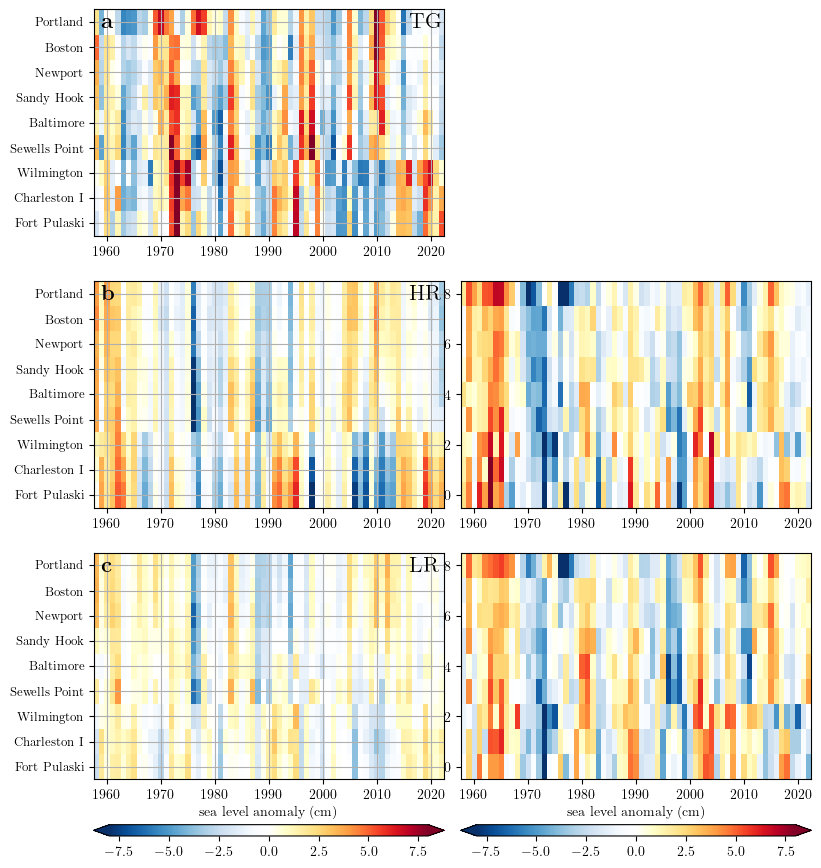

In [9]:
fig = plt.figure(figsize=(14,10))#, tight_layout=True)
plt.subplots_adjust(wspace=0.1, hspace=0.2)

nsim=1
cmap = mycolors.blue2red_cmap(20)
# cmap='Spectral_r'
ylabspacing = 1
da_anns=[]
vmin = -8
vmax2 = -vmin
titstr=["TG","HR","LR"]

for ncol in np.arange(2):
    if ncol<1:
        for nsim in np.arange(3):
            if nsim<1:
                plotvar=xr_tg
            else:
                if nsim<2:
                    plotvar=hr_tg
                else:            
                    plotvar=lr_tg
            da_anns.append(plotvar)
            
            ax1 = plt.subplot2grid((3,6), (nsim, ncol*2), colspan=2, rowspan=1)
        
            filled1 = ax1.pcolormesh(
                plotvar.time,
                np.arange(0, len(tgnames), 1),
                plotvar.T,
                vmin=vmin,
                vmax=vmax2,
                cmap=cmap,
                shading="nearest",
            )
            plt.figtext(0.02, .9, r"$\bf{" + panellabs[nsim] + '' "}$" , horizontalalignment='left', 
                            verticalalignment='bottom', fontsize=16, transform=ax1.transAxes)
            ticks = np.arange(0, len(tgnames), ylabspacing)
            if nsim<5:
                labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
            else:
                labels = []
            ax1.yaxis.set_ticks(ticks, labels=labels, fontsize=9)
            # plt.title(titstr)
            plt.ylim([-.5, len(tgnames)-.5])
            plt.grid()
            pos = ax1.get_position()  # get the original position
            
            if nsim>1:
                cbar_ax = fig.add_axes(
                    [pos.x0, pos.y0-(pos.y1 - pos.y0)/4, (pos.x1-pos.x0), (pos.y1 - pos.y0)/20]
                )
                cbar = fig.colorbar(filled1, orientation="horizontal", cax=cbar_ax, extend="both",ticklocation='bottom')
                cbar.ax.set_title("sea level anomaly (cm)", rotation=0, size=10, weight="bold")
                cbar.ax.tick_params(labelsize=10)
            plt.figtext(0.9, .9, titstr[nsim] , horizontalalignment='left', 
                            verticalalignment='bottom', fontsize=16, transform=ax1.transAxes)
    else:
        for nsim in np.arange(2)+1:
            plotvar=da_anns[nsim]-da_anns[0]

            ax1 = plt.subplot2grid((3,6), (nsim, ncol*2), colspan=2, rowspan=1)
        
            filled1 = ax1.pcolormesh(
                plotvar.time,
                np.arange(0, len(tgnames), 1),
                plotvar.T,
                vmin=vmin,
                vmax=vmax2,
                cmap=cmap,
                shading="nearest",
            )

            # ticks = np.arange(0, len(tgnames), ylabspacing)
            # if nsim<5:
            #     labels = shortname[np.arange(0, len(tgnames), ylabspacing)]
            # else:
            #     labels = []

            # plt.ylim([-.5, len(tgnames)-.5])
            # plt.grid()
            pos = ax1.get_position()  # get the original position
            
            if nsim>1:
                cbar_ax = fig.add_axes(
                    [pos.x0, pos.y0-(pos.y1 - pos.y0)/4, (pos.x1-pos.x0), (pos.y1 - pos.y0)/20]
                )
                cbar = fig.colorbar(filled1, orientation="horizontal", cax=cbar_ax, extend="both",ticklocation='bottom')
                cbar.ax.set_title("sea level anomaly (cm)", rotation=0, size=10, weight="bold")
                cbar.ax.tick_params(labelsize=10)
                

* note issues pre-1975: missing GSA anomalies? Initialization issues?
* Not much variation between TG's -- subsequent analysis uses Charleston only

In [10]:
def process_tgs(fname, syear, eyear):
    dsin=xr.open_dataset(fname)
    dsin=dsin.sel(time=slice(syear,eyear))
    return dsin.ssh-dsin.ssh.mean(dim='time')

In [11]:
da_anns=[]
startyear=1975
endyear=2022
lr_tg=lr_tg.sel(time=slice(startyear,endyear))
hr_tg=hr_tg.sel(time=slice(startyear,endyear))
xr_tg=xr_tg.sel(time=slice(startyear,endyear))
xr_tg=xr_tg-xr_tg.mean(dim='time')
hr_tg=hr_tg-hr_tg.mean(dim='time')
lr_tg=lr_tg-lr_tg.mean(dim='time')

for nsim in np.arange(3):
    if nsim<1:
        plotvar=xr_tg
    else:
        if nsim<2:
            plotvar=hr_tg
        else:            
            plotvar=lr_tg
    da_anns.append(plotvar)

In [12]:
da_SH=[]

for nsim in np.arange(3):
    if nsim<1:
        # plotvar=xr_tg.isel(tgindex=slice(0,3))
        plotvar=xr_tg.isel(tgindex=slice(1,2))
    else:
        if nsim<2:
            plotvar=hr_tg.isel(tgindex=slice(0,3))
            plotvar=hr_tg.isel(tgindex=slice(1,2))
        else:            
            plotvar=lr_tg.isel(tgindex=slice(0,3))
            plotvar=lr_tg.isel(tgindex=slice(1,2))
    da_SH.append(plotvar.mean(dim='tgindex'))
# da_SH    

In [13]:
focustg='234'

In [14]:
# nao=xr.open_dataset('nao.long.nc')
# # nao=nao.sel(time=slice('1957-12-31','2022-12-31'))
# nao=nao.sel(time=slice('1979-12-31','2022-12-31'))
# nao_am=nao.value.groupby('time.year').mean('time').rename({'year':'time'})
# nao_am=nao_am/nao_am.std(dim='time')

In [15]:
cutoff=13
fs=1
order=5
da_SH_hp=[]
da_SH_lp=[]

for nsim in np.arange(3):
    if nsim<1:
        plotvar=filtfilt_bpbutter_2d_high(xr_tg,1/cutoff,1/cutoff,fs,order,dim='time')
        # plotvar=xr_tg
    else:
        if nsim<2:
            plotvar=filtfilt_bpbutter_2d_high(hr_tg,1/cutoff,1/cutoff,fs,order,dim='time')
            # plotvar=hr_tg
        else:            
            plotvar=filtfilt_bpbutter_2d_high(lr_tg,1/cutoff,1/cutoff,fs,order,dim='time')
            # plotvar=lr_tg
    da_SH_hp.append(plotvar.isel(tgindex=slice(1,2)).mean(dim='tgindex'))
    tt=da_SH[nsim]-plotvar.isel(tgindex=slice(1,2)).mean(dim='tgindex')
    # da_SH_lp.append(tt[int(np.floor(cutoff/2)):-int(np.floor(cutoff/2))])
    da_SH_lp.append(tt)
# da_SH    

In [38]:
t1=2008
t2=t1+10

/glade/derecho/scratch/clittle/tmp/ipykernel_47552/3765111202.py:37: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects
/glade/derecho/scratch/clittle/tmp/ipykernel_47552/3765111202.py:37: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects
/glade/derecho/scratch/clittle/tmp/ipykernel_47552/3765111202.py:37: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


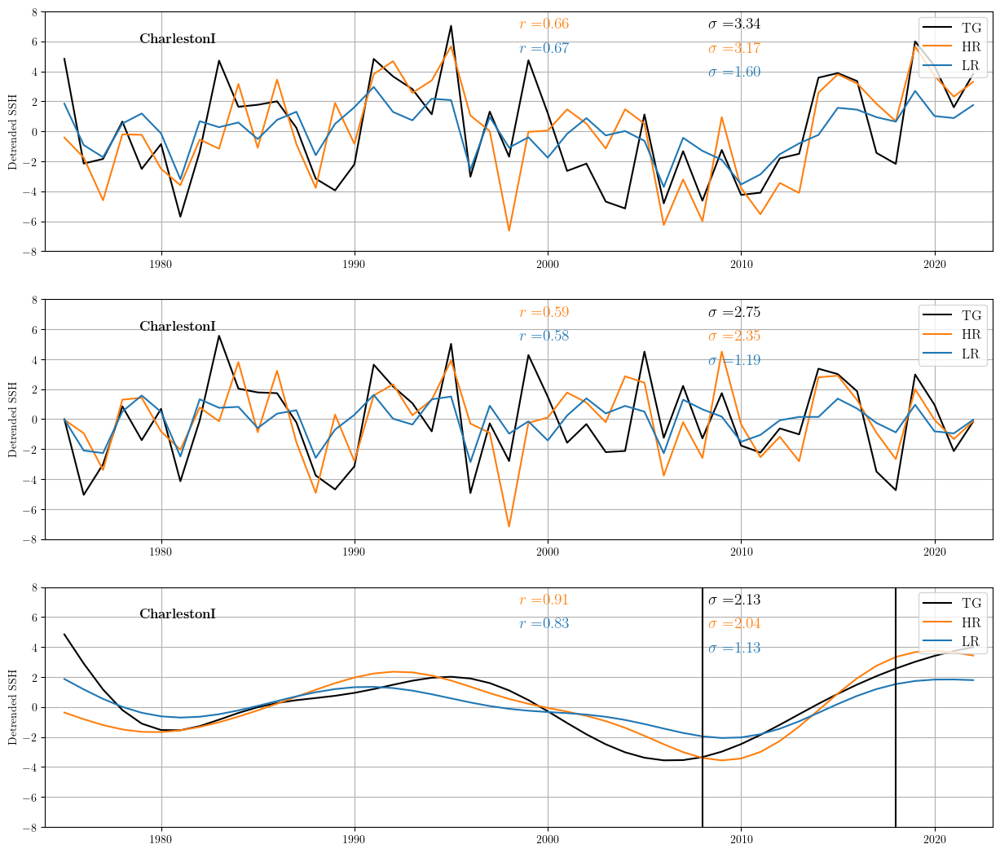

In [39]:
fig = plt.figure(figsize=(15,13))#, tight_layout=True)

for nsp in np.arange(3):
    if nsp<1:
        plotvar=da_SH
    else:
        if nsp<2:
            plotvar=da_SH_hp
        else:            
            plotvar=da_SH_lp
    ax = plt.subplot2grid((3,3), (nsp,0), colspan=3, rowspan=1)    
            
    for nsim in np.arange(3):
        line = ax.plot(plotvar[nsim].time,plotvar[nsim],cols[nsim], label = 'data')
        if nsim>0:
            tt=np.corrcoef(plotvar[nsim],plotvar[0])
            
            if nsim>1:
                ax.text(.5,.93, '$r=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
                    transform=ax.transAxes, fontsize=14, weight='bold',color='C1')
            else:
                ax.text(.5,.83, '$r=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
                transform=ax.transAxes, fontsize=14, weight='bold',color='C0') 
                
        tt=(plotvar[nsim]).std()
        ax.text(.7,.93-.1*nsim, '$\sigma=$'+str('{0:.2f}'.format(tt)),#+', ',
                    transform=ax.transAxes, fontsize=14, weight='bold',color=cols[nsim])
    
                # line = ax.plot(da_anns[nsim].time,nao_am,'k--')
    if nsp>1:
        line = ax.plot([t1,t1],[-10,10],cols[0], ls='-',label = 'data')
        line = ax.plot([t2,t2],[-10,10],cols[0], ls='-',label = 'data')
    plt.grid()
    plt.ylabel('Detrended SSH')
    plt.ylim(-8,8)
    plt.xlim(1974,2023)
    ax.legend([],     # The line objects
           labels=["TG","HR","LR"],   # The labels for each line
           loc="upper right",   # Position of legend
           borderaxespad=0.4,    # Small spacing around legend box
           title="",
           fontsize=12,# Title for the legend
             )
    plt.figtext(0.1, .86, r"$\bf{" + str(shortname[focustg]) + '' "}$", horizontalalignment='left', 
                verticalalignment='bottom', fontsize=12, transform=ax.transAxes)

* Multiple timescales evident. decadal+interannual variations; we separate using a 13-year filter
* LR damped at both timescales (~50% of variance), but seems to capture decadal variations
* Correlations may be influenced by intrinsic variability, ocean model, or forcing errors.
* HR and LR show an earlier peak and a later minimum
* Last 10 years of decadal variations corresponds to rapid increase noted by Dangendorf, Chang, others.
* We note two periods where we calculate differences with vertical lines

## Altimetry analysis

In [18]:
datadir = '/glade/work/clittle/altimetry/MEASURES/monthly/'
alt=xr.open_mfdataset(datadir+'monthly*.nc')
alt=alt*100
alt=alt.rename({'Time': 'time','Longitude':'lon','Lon_bounds':'lon_b','Latitude':'lat','Lat_bounds':'lat_b'})
alt = alt.drop(['lon_b','lat_b'])
ds_alt=alt.sel(time=slice('1993-01-01', '2023-01-01'))
gmsl = xr.open_dataset("../NSF-OCE_2148596/notebooks/USEC_FOSI_rez_comp/gmsl_mo.nc")
gmsl=gmsl.sel(time=slice('1993-01-01', '2023-01-01'))#,Longitude=slice(xlo,xhi),Latitude=slice(ylo,yhi))
gmsl=gmsl.gmsl_variation/10

/glade/derecho/scratch/clittle/tmp/ipykernel_47552/3635674441.py:5: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  alt = alt.drop(['lon_b','lat_b'])


In [19]:
xlo=1550; xhi=2200; ylo=550; yhi=900;
da=ds_alt.SLA-gmsl
da=da.isel(lon=slice(xlo,xhi),lat=slice(ylo,yhi))#.sel(time=slice('1993-01-01','2019-1-1'))
# da['time']=xr_tg.time
# da

In [20]:
[da_alt, datrend]=detrend_deseason(da.load())

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/dask/utils.py:73: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  return func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/dask/utils.py:73: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  return func(*args, **kwargs)


In [21]:
pvalc=.05
ds_bathy = xr.open_dataset('/glade/work/clittle/p2521/input/'+"/obs/GEBCO.nc")
# Get depth
ds_bathy=ds_bathy.rename({'longitude':'TLONG','latitude':'TLAT'})

def preproc(d0):
    d0 = d0[["HT","TAREA"]]
    return d0
   
diri = '/glade/campaign/collections/cmip/CMIP6/CESM-HR/FOSI/HR/g.e20.G.TL319_t13.control.001/ocn/proc/tseries/month_1/'
dfile=diri+'g.e20.G.TL319_t13.control.001.pop.h.SSH.012901-012912.nc'
 
ds = xr.open_mfdataset(
    dfile,
    combine="by_coords",
    coords="minimal",
    compat="override",
    preprocess=preproc,
    parallel=True,
)

ylo=1200; yhi=2200; xlo=100; xhi=1000; #HR2 EC SMALL

hrdepth = ds.HT.isel(nlon=slice(xlo,xhi),nlat=slice(ylo,yhi)) / 100
                     
diri = '/glade/campaign/collections/cmip/CMIP6/CESM-HR/FOSI/LR/g210.GIAF_JRA.v14.gx1v7.02/ocn/hist/'
dfile=diri+'g210.GIAF_JRA.v14.gx1v7.02.pop.h.0240-12.nc'
 
ds = xr.open_mfdataset(
    dfile,
    combine="by_coords",
    coords="minimal",
    compat="override",
    preprocess=preproc,
    parallel=True,
)
 
lrdepth = ds.HT / 100

depths=[]
depths.append(-ds_bathy.depth)
depths.append(hrdepth)
depths.append(lrdepth)

## Comp with TG/Altimetry, 1993-2022, high-pass filtered timeseries

/glade/derecho/scratch/clittle/tmp/ipykernel_47552/2481731473.py:7: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


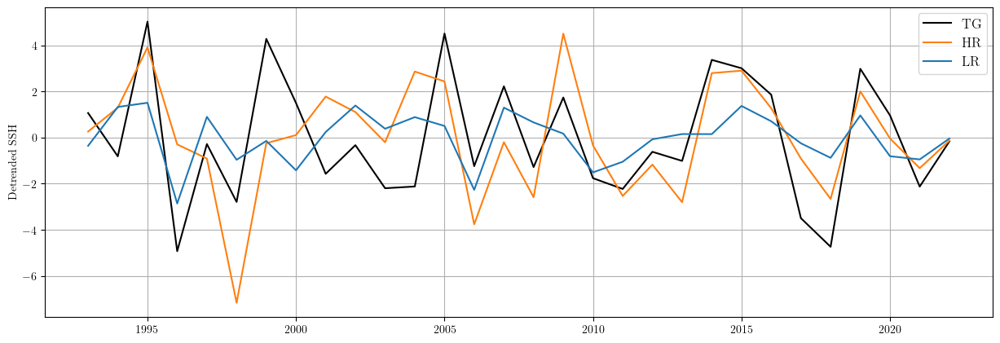

In [22]:
fig = plt.figure(figsize=(15,13))#, tight_layout=True)
ax = plt.subplot2grid((5,3), (3,0), colspan=3, rowspan=2)    
for nsim in np.arange(3):
    line = ax.plot(da_SH[nsim].sel(time=slice(1993,2022)).time,da_SH_hp[nsim].sel(time=slice(1993,2022)),cols[nsim], label = 'data')
plt.grid()
plt.ylabel('Detrended SSH')
ax.legend([],     # The line objects
       labels=["TG","HR","LR"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=12,# Title for the legend
         )

In [23]:
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/hr_alpaca_ssh_det.nc')
dahr=ssh.ssh.sel(time=slice(1993,2022))
# [dahr, datrend]=detrend_linear2(dahr.load(),'time')
# dahr=ssh.groupby('time.year').mean('time').rename({'year':'time'})#
ssh = xr.open_mfdataset('/glade/derecho/scratch/clittle/lr_alpaca_ssh_det.nc')
dalr=ssh.ssh.sel(time=slice(1993,2022))
[dalr, datrend]=detrend_linear2(dalr.load(),'time')
da_ann=da_alt.rename({'lat':'TLAT','lon':'TLONG'}).groupby('time.year').mean('time').rename({'year':'time'})
# dalr=ssh.groupby('time.year').mean('time').rename({'year':'time'})

In [24]:
da_hp=filtfilt_bpbutter_3d_high(da_ann,1/cutoff,1/cutoff,fs,order,'TLONG','TLAT',dim='time')
dahr_hp=filtfilt_bpbutter_3d_high(dahr.load(),1/cutoff,1/cutoff,fs,order,'nlat','nlon',dim='time')
dalr_hp=filtfilt_bpbutter_3d_high(dalr.load(),1/cutoff,1/cutoff,fs,order,'nlat','nlon',dim='time')

#noHP
# da_hp=da_ann.T
# dahr_hp=dahr.load().T
# dalr_hp=dalr.load().T

da_lp=da_ann-da_hp
dahr_lp=dahr-dahr_hp
dalr_lp=dalr-dalr_hp

In [25]:
def plot_ssh_variance(SSH,depths,tglons,tglats, vmin, labels, cmap):
    fig = plt.figure(figsize=(15,9), tight_layout=True)
    vmax=vmin
    vmin=0
    cmap = cmap
    # norm = SymLogNorm(linthresh=.5, linscale=0.1, vmin=vmin, vmax=-vmin, base=2)

    for nsim in np.arange(len(SSH)):# #:#
        lons=SSH[nsim].TLONG.fillna(0)
        lats=SSH[nsim].TLAT.fillna(0)
        odepth=depths[nsim]
        
        for nsp in np.arange(2):
            if nsp<1:
                ax = plt.subplot2grid((3,4), (0, nsim), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
                ax.set_extent([-83, -60, 20, 52], crs=xccrs.PlateCarree())
                ax.set_extent([-75, -72, 20, 52], crs=xccrs.PlateCarree())
            else:
                ax = plt.subplot2grid((3,4), (2, nsim), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")
                ax.set_extent([-85, 0, 15, 70], crs=xccrs.PlateCarree())

            im = ax.pcolormesh(lons, lats, (SSH[nsim]), shading='nearest', vmin=0,vmax=vmax,
                        cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    

            CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
                            np.arange(100,100.5,1),colors='.6',linewidths=2,zorder=2,transform=xccrs.PlateCarree())
            CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
                            np.arange(1000,1999,1000),colors='.6',linewidths=1,zorder=2,transform=xccrs.PlateCarree())            
            # if nsp<1:
            #     CS2 = ax.contour(lons, lats, (SSH[0]),
            #                 np.arange(1,8,2),colors='k',linewidths=2,zorder=2,transform=xccrs.PlateCarree())            

            plt.scatter(x=tgs_in.lon['234'], y=tgs_in.lat['234'],s=abs(nsp-2)*125, edgecolors="k",marker='*',zorder=7, transform=xccrs.PlateCarree())  ## Important
            
            
            if nsim+nsp==0:
                pos = ax.get_position() # get the original position 
                cbar_ax = fig.add_axes(
                    [pos.x0 -.07, pos.y0+(pos.y1 - pos.y0)*.3, (pos.x1 - pos.x0)/20, .8*(pos.y1 - pos.y0)]
                )
                cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
                cbar.ax.tick_params(labelsize=10)
   
            ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
            
            if nsp<1:
                plt.figtext(.05, .95, labels[nsim], horizontalalignment='left', verticalalignment='center', fontsize=14, transform=ax.transAxes)
    
            ax.coastlines(zorder=5)
            ax.gridlines()

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


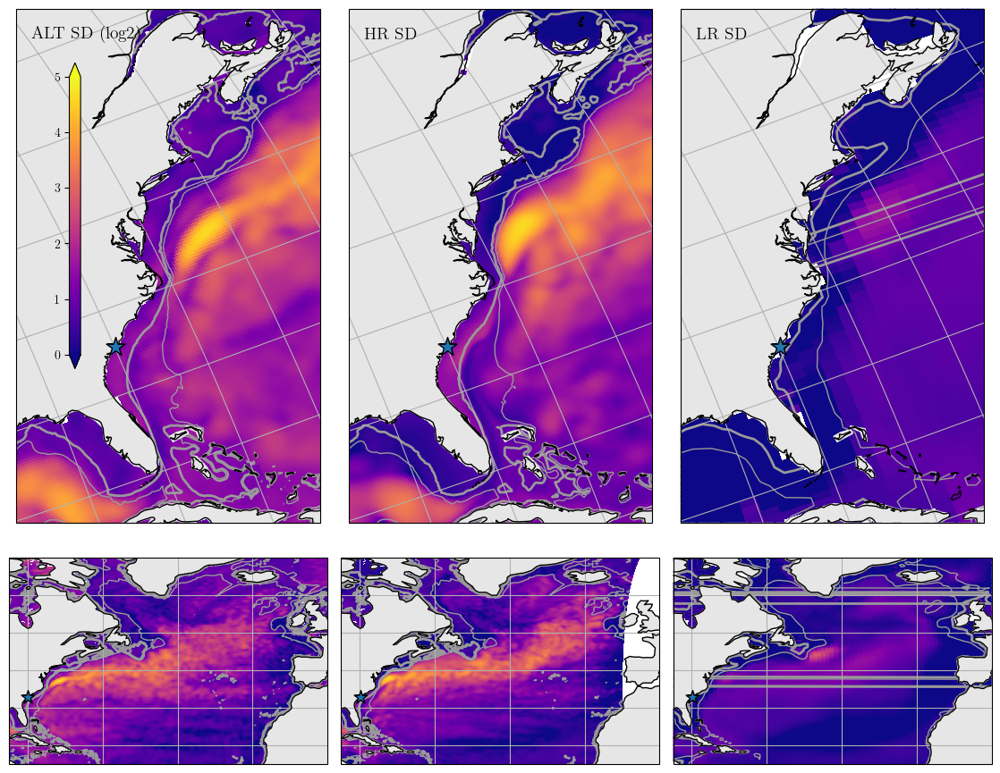

In [26]:
labels=["ALT SD (log2)","HR SD","LR SD"]   # The labels for each line
SSHs=[]
SSHs.append(np.log2(da_hp.T.std(dim='time')))
SSHs.append(np.log2(dahr_hp.T.std(dim='time')))
SSHs.append(np.log2(dalr_hp.T.std(dim='time')))
plot_ssh_variance(SSHs,depths,da.lon,da.lat, 5, labels,'plasma')#mycolors.blue2red_cmap(20))

* HR does OK, LR damped: shelf enhancement, detachment enhancement, slope current enhancement
* HR mean bias evident.

In [29]:
from matplotlib.colors import SymLogNorm#, DivergingNorm

def plot_ssh_reg3(tgpcs,SSH,depths,labels, lagx, coast_reg=True, do_plot=True):
    fig = plt.figure(figsize=(18,11), tight_layout=True)
    vmin=-15
    rcs=[]

    cmap = mycolors.blue2red_cmap(20)
    norm = SymLogNorm(linthresh=.5, linscale=0.1, vmin=vmin, vmax=-vmin, base=2)

    if coast_reg:
        sims=np.arange(len(SSH))
    else:
        sims=np.arange(2)+1
        
    for nsim in sims:#[1,2]:# #:#
        # print(nsim)
        # print(SSH)
        lons=SSH[nsim].TLONG.fillna(0)
        lats=SSH[nsim].TLAT.fillna(0)
        regressand=SSH[nsim] 
        odepth=depths[nsim]
        # print(regressand)
        focusts=regressand[:,0,0].fillna(0)*0+np.real(tgpcs[nsim].T)
        cov,cor,slope,intercept,pval,stderr = lag_linregress_3D(x=focusts,y=regressand, lagx=lagx)
        altrc=slope*tgpcs[nsim].std()+regressand[0,:,:]*0
        altpval=pval
        mask=1+0/(pval<pvalc)

        if do_plot:
            for nsp in np.arange(2):
                if nsp<1:
                    ax = plt.subplot2grid((3,4), (0, nsim), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
                    ax.set_extent([-83, -60, 20, 52], crs=xccrs.PlateCarree())
                    ax.set_extent([-75, -68, 20, 52], crs=xccrs.PlateCarree())
                else:
                    ax = plt.subplot2grid((3,4), (2, nsim), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")
                    ax.set_extent([-100, 0, 10, 70], crs=xccrs.PlateCarree())
    
                im = ax.pcolormesh(lons, lats, mask*altrc, norm=norm, shading='nearest',
                            cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    
    
                CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
                                np.arange(100,100.5,1),colors='.6',linewidths=2,zorder=2,transform=xccrs.PlateCarree())
                CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
                                np.arange(1000,1999,1000),colors='.6',linewidths=1,zorder=2,transform=xccrs.PlateCarree())            
                
                plt.scatter(x=tgs_in.lon['234'], y=tgs_in.lat['234'],s=250, edgecolors="k",marker='*',zorder=7, transform=xccrs.PlateCarree())  ## Important
                
                if nsim+nsp==0:
                    pos = ax.get_position() # get the original position 
                    cbar_ax = fig.add_axes(
                        [pos.x0 -.09, pos.y0+(pos.y1 - pos.y0)*.3, (pos.x1 - pos.x0)/20, .8*(pos.y1 - pos.y0)]
                    )
                    cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
                    cbar.ax.tick_params(labelsize=10)
       
                ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
                if nsp<1:
                    plt.figtext(.05, .95, labels[nsim], horizontalalignment='left', verticalalignment='center', fontsize=14, transform=ax.transAxes)
        
                ax.coastlines(zorder=5)
                ax.gridlines()
        else:
            rc=mask*altrc
            rcs.append(rc)        
    return rcs

array([1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022])

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


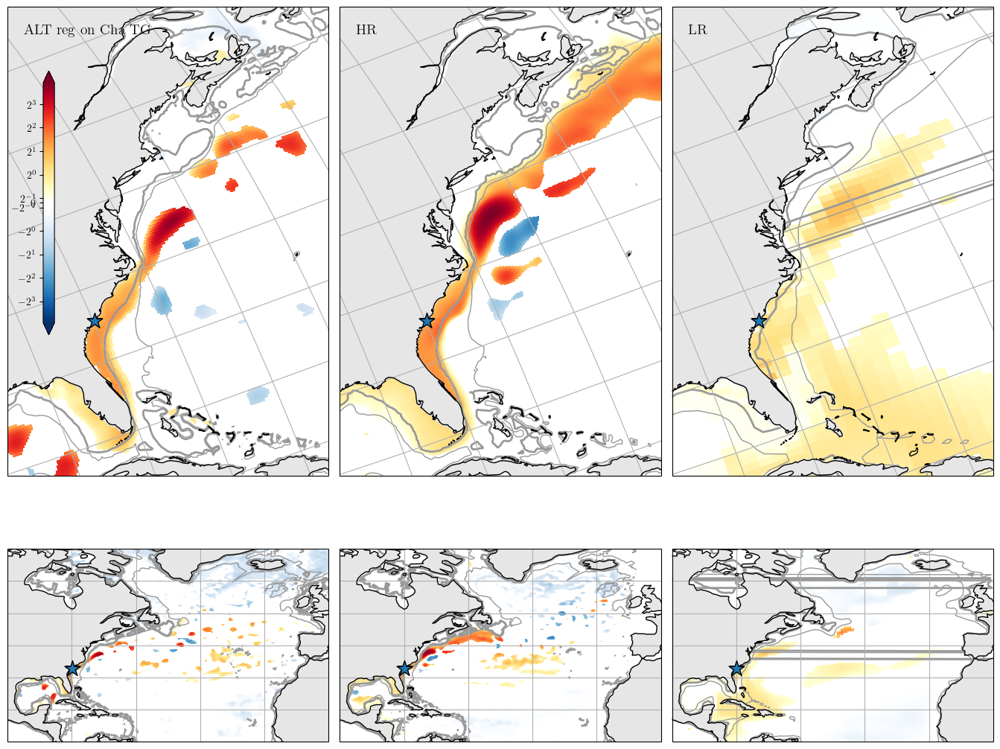

In [30]:
SSHs=[]
labels=["ALT reg on Cha TG","HR","LR"]   # The labels for each line

SSHs.append(da_hp.T)
SSHs.append(dahr_hp.T)
SSHs.append(dalr_hp.T)
plot_ssh_reg3(da_SH_hp,SSHs,depths,labels, 0, True)
SSHs[0].time.values

* Correlation btwn detachment and SAB in HR and ALT
* What drives pattern? Is the detachement responsible for the enhancement in HR? [Does the mean state bias matter?]

In [51]:
SSH_HR_comp=[]
SSH_LR_comp=[]
SSH_HR_comp_hp=[]
SSH_LR_comp_hp=[]
SSH_HR_comp_lp=[]
SSH_LR_comp_lp=[]

for nsim in np.arange(5):
    if nsim<1:
        tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/hr_alpaca_ssh_det.nc')
        plotvar1=tt.ssh.load()
        tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/lr_alpaca_ssh_det.nc')
        plotvar2=tt.ssh.load()
        titstr="Full"
    else:
        if nsim<2:
            tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_m.nc')
            plotvar1=tt.ssh.load()
            tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_m.nc')
            plotvar2=tt.ssh.load()
            titstr="Mom"
        else:
            if nsim<3:
                tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_b.nc')
                plotvar1=tt.__xarray_dataarray_variable__.load()
                tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_b.nc')
                plotvar2=tt.ssh.load()
                titstr="Buoy"
            else:
                if nsim<4:
                    tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_r.nc')
                    plotvar1=tt.__xarray_dataarray_variable__.load()
                    tt=xr.open_mfdataset('/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_r.nc')
                    plotvar2=tt.ssh.load()
                    titstr="RYF"
                else:
                    plotvar1=SSH_HR_comp[0]-SSH_HR_comp[1]-SSH_HR_comp[2]
                    plotvar2=SSH_LR_comp[0]-SSH_LR_comp[1]-SSH_LR_comp[2]
                    titstr="Full-Mom-Buoy"
    SSH_HR_comp.append(plotvar1)
    SSH_LR_comp.append(plotvar2)
    plotvar1hp=filtfilt_bpbutter_3d_high(plotvar1,1/cutoff,1/cutoff,fs,order,'nlat','nlon',dim='time')
    plotvar2hp=filtfilt_bpbutter_3d_high(plotvar2,1/cutoff,1/cutoff,fs,order,'nlat','nlon',dim='time')
    tt=plotvar1-plotvar1hp
    # SSH_HR_comp_lp.append(tt.sel(time=slice(startyear+np.floor(cutoff/2),endyear-np.floor(cutoff/2))))
    SSH_HR_comp_lp.append(tt)
    tt=plotvar2-plotvar2hp
    # SSH_LR_comp_lp.append(tt.sel(time=slice(startyear+np.floor(cutoff/2),endyear-np.floor(cutoff/2))))
    SSH_LR_comp_lp.append(tt)
    SSH_HR_comp_hp.append(plotvar1hp)
    SSH_LR_comp_hp.append(plotvar2hp)
# da_SH    

In [52]:
SSH_LR_comp_hp
# SSH_HR_comp_hp=SSH_HR_comp

[<xarray.DataArray 'ssh' (nlat: 384, nlon: 320, time: 66)> Size: 65MB
 array([[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]],
 
        [[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
              

[]

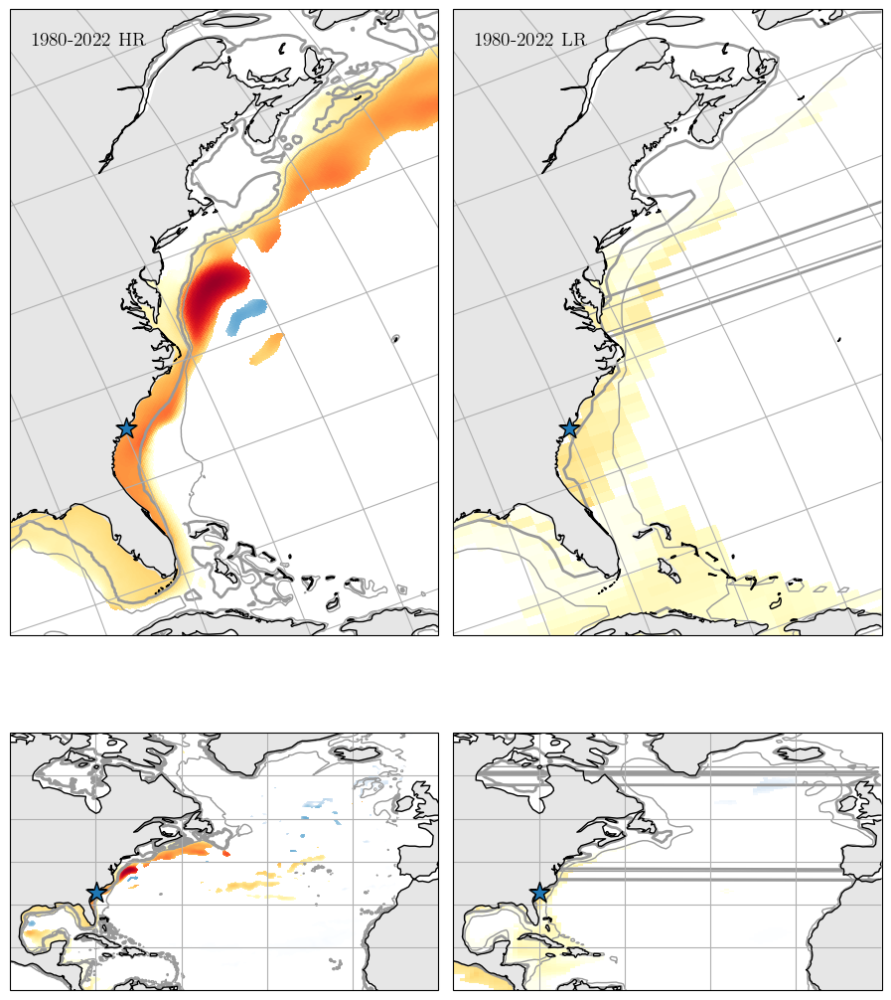

In [36]:
SSHs=[]
labels=["","1980-2022 HR","1980-2022 LR"]   # The labels for each line
nsim=0
SSHs.append(SSH_HR_comp[nsim])
SSHs.append(SSH_HR_comp[nsim])
SSHs.append(SSH_LR_comp[nsim])
plot_ssh_reg3(da_SH_hp,SSHs,depths,labels, 0, False)

* 1980-essentially identical

In [37]:
def plot_ssh_timeslice(SSH,depths,tglons,tglats, vmin, labels):
    fig = plt.figure(figsize=(15,8), tight_layout=True)
    vmin=vmin
    vmax=-vmin
    cmap = mycolors.blue2red_cmap(20)
    norm = SymLogNorm(linthresh=.5, linscale=0.1, vmin=vmin, vmax=-vmin, base=2)

    for nsim in np.arange(len(SSH)):# #:#
        lons=SSH[nsim].TLONG.fillna(0)
        lats=SSH[nsim].TLAT.fillna(0)
        odepth=depths[1]
        
        for nsp in np.arange(2):
            if nsp<1:
                ax = plt.subplot2grid((3,4), (0, nsim), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
                ax.set_extent([-83, -60, 20, 52], crs=xccrs.PlateCarree())
                ax.set_extent([-75, -68, 20, 52], crs=xccrs.PlateCarree())
            else:
                ax = plt.subplot2grid((3,4), (2, nsim), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")
                ax.set_extent([-85, 0, 15, 70], crs=xccrs.PlateCarree())

            im = ax.pcolormesh(lons, lats, SSH[nsim], shading='nearest', norm=norm,
                        cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    

            CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
                            np.arange(100,100.5,1),colors='.6',linewidths=2,zorder=2,transform=xccrs.PlateCarree())
            CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
                            np.arange(1000,1999,1000),colors='.6',linewidths=1,zorder=2,transform=xccrs.PlateCarree())            

            plt.scatter(x=tgs_in.lon['234'], y=tgs_in.lat['234'],s=abs(nsp-2)*125, edgecolors="k",marker='*',zorder=7, transform=xccrs.PlateCarree())  ## Important
            
            
            if nsim+nsp==0:
                pos = ax.get_position() # get the original position 
                cbar_ax = fig.add_axes(
                    [pos.x0 -.07, pos.y0+(pos.y1 - pos.y0)*.3, (pos.x1 - pos.x0)/20, .8*(pos.y1 - pos.y0)]
                )
                cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
                cbar.ax.tick_params(labelsize=10)
   
            ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
            
            if nsp<1:
                plt.figtext(.05, .95, labels[nsim], horizontalalignment='left', verticalalignment='center', fontsize=14, transform=ax.transAxes)
    
            ax.coastlines(zorder=5)
            ax.gridlines()

## decadal change (LPF)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


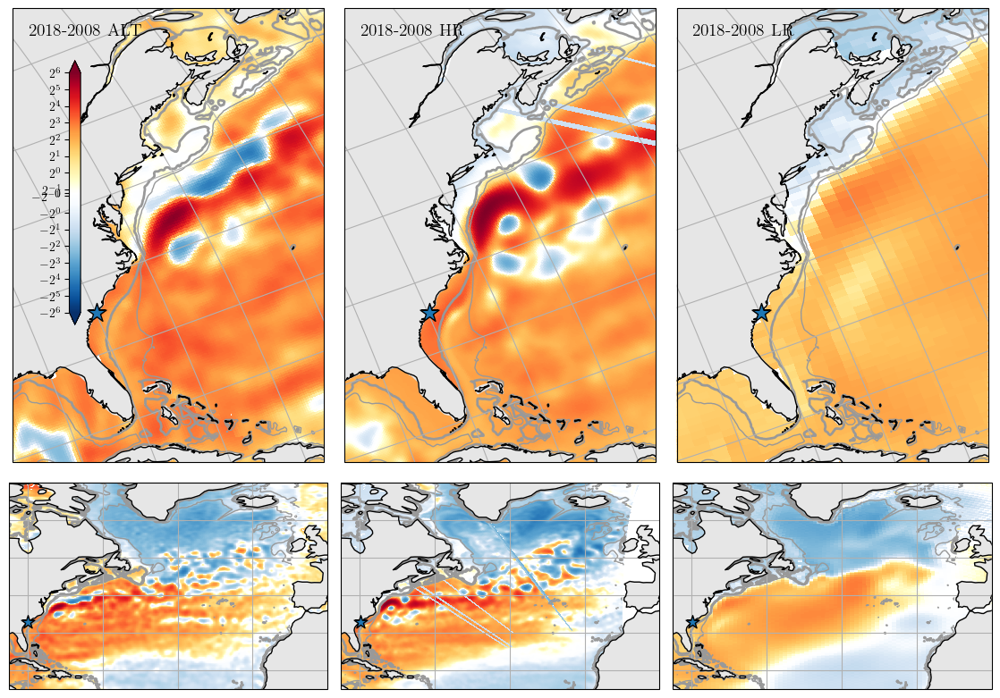

In [40]:
labels=[str(t2) + "-" + str(t1) + " ALT",str(t2) + "-" + str(t1) + " HR",str(t2) + "-" + str(t1) + " LR"]   # The labels for each line
SSHs=[]
SSHs.append(da_lp.sel(time=t2)-da_lp.sel(time=t1))
SSHs.append(dahr_lp.sel(time=t2)-dahr_lp.sel(time=t1))
SSHs.append(dalr_lp.sel(time=t2)-dalr_lp.sel(time=t1))
# SSHs.append(da_lp.sel(time=t1))
# SSHs.append(dahr_lp.sel(time=t1))
# SSHs.append(dalr_lp.sel(time=t1))
plot_ssh_timeslice(SSHs,depths,da.lon,da.lat, -64, labels)
# SSHs

* detachment and SAB enhancement
* out of phase with SPG (piecuch et al. 2017) heat content. Warm STG/Cold SPG, GS north!
* Both timescales show a potential role of GS in enhancing the SH sea level, but interior ocean less coherent over interannual timescales

## HP first: what is relationship between GS detachment and coast, and what is driver?

* We know that this could be purely intrinsic presence in HR. Null hypothesis: resolution sensitivity is just due to intrinsic variability
* We can also separate M+B

In [41]:
fname='/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_tgs_m_long2.nc'
hr_m_tg=process_tgs(fname,startyear,endyear)
fname='/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_tgs_b_long2.nc'
hr_b_tg=process_tgs(fname,startyear,endyear)
fname='/glade/derecho/scratch/clittle/hr_alpaca_ssh_det_tgs_r_long2.nc'
hr_r_tg=process_tgs(fname,startyear,endyear)
fname='/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_tgs_m_long2.nc'
lr_m_tg=process_tgs(fname,startyear,endyear)
fname='/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_tgs_b_long2.nc'
lr_b_tg=process_tgs(fname,startyear,endyear)
fname='/glade/derecho/scratch/clittle/lr_alpaca_ssh_det_tgs_r_long2.nc'
lr_r_tg=process_tgs(fname,startyear,endyear)

In [53]:
da_HR_comp=[]
da_LR_comp=[]
da_HR_comp_hp=[]
da_LR_comp_hp=[]
da_HR_comp_lp=[]
da_LR_comp_lp=[]

for nsim in np.arange(6):
    if nsim<1:
        plotvar1=hr_tg
        plotvar2=lr_tg
        titstr="Full"
    else:
        if nsim<2:
            plotvar1=hr_m_tg.T
            plotvar2=lr_m_tg.T
            titstr="Mom"
        else:
            if nsim<3:
                plotvar1=hr_b_tg.T
                plotvar2=lr_b_tg.T
                titstr="Buoy"
            else:
                if nsim<4:
                    plotvar1=hr_r_tg.T
                    plotvar2=lr_r_tg.T
                    titstr="RYF"
                else:
                    plotvar1=(hr_tg.T-hr_m_tg-hr_b_tg).T
                    plotvar2=(lr_tg.T-lr_m_tg-lr_b_tg).T
                    titstr="Full-Mom-Buoy"
                    
    da_HR_comp.append(plotvar1.isel(tgindex=slice(1,2)).mean(dim='tgindex'))
    da_LR_comp.append(plotvar2.isel(tgindex=slice(1,2)).mean(dim='tgindex'))
    
    plotvar1hp=filtfilt_bpbutter_2d_high(plotvar1,1/cutoff,1/cutoff,fs,order,dim='time')
    plotvar2hp=filtfilt_bpbutter_2d_high(plotvar2,1/cutoff,1/cutoff,fs,order,dim='time')

    tt=plotvar1.isel(tgindex=slice(1,2)).mean(dim='tgindex')-plotvar1hp.isel(tgindex=slice(1,2)).mean(dim='tgindex')
    # da_HR_comp_lp.append(tt.sel(time=slice(startyear+np.floor(cutoff/2),endyear-np.floor(cutoff/2))))
    da_HR_comp_lp.append(tt)
    tt=plotvar2.isel(tgindex=slice(1,2)).mean(dim='tgindex')-plotvar2hp.isel(tgindex=slice(1,2)).mean(dim='tgindex')
    # da_LR_comp_lp.append(tt.sel(time=slice(startyear+np.floor(cutoff/2),endyear-np.floor(cutoff/2))))
    da_LR_comp_lp.append(tt)
    
    da_HR_comp_hp.append(plotvar1hp.isel(tgindex=slice(1,2)).mean(dim='tgindex'))
    da_LR_comp_hp.append(plotvar2hp.isel(tgindex=slice(1,2)).mean(dim='tgindex'))

In [43]:
# da_HR_comp_hp=da_HR_comp
# da_LR_comp_hp=da_LR_comp

/glade/derecho/scratch/clittle/tmp/ipykernel_47552/1872478083.py:30: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects
/glade/derecho/scratch/clittle/tmp/ipykernel_47552/1872478083.py:50: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


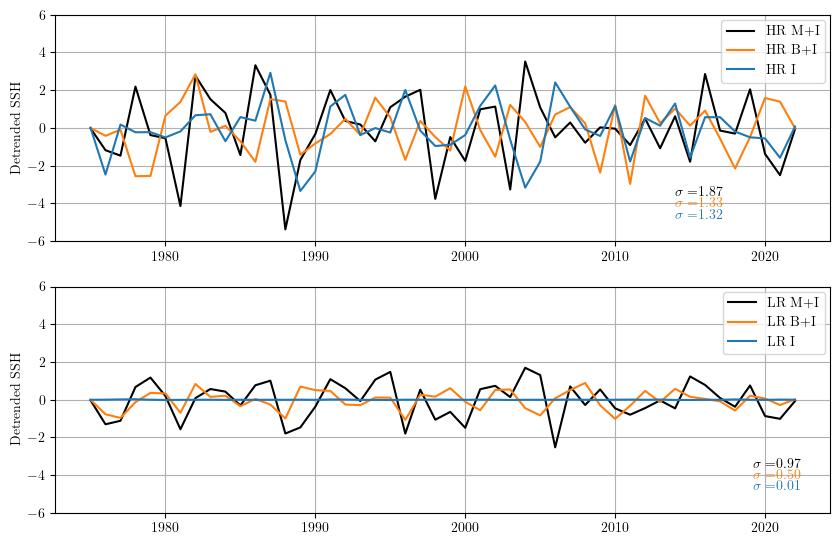

In [44]:
fig = plt.figure(figsize=(10,10))#, tight_layout=True)
ax = plt.subplot2grid((3,3), (0,0), colspan=3, rowspan=1)    
# sims=[1,2,3,4]
sims=[1,2,3]
for nsims in np.arange(len(sims)):
    nsim=sims[nsims]
    line = ax.plot(da_HR_comp_hp[nsim].time,da_HR_comp_hp[nsim],cols[nsims], label = 'data')
            
    tt1=(da_HR_comp_hp[nsim]).std()
    # tt2=(da_HR_comp[nsim]).sel(time=slice(2001,2022)).std()
    
    ax.text(.8,.2-.05*nsims, '$\sigma=$'+str('{0:.2f}'.format(tt1)),#+', ',
                transform=ax.transAxes, fontsize=10, weight='bold',color=cols[nsims])
    # ax.text(.9,.2-.05*nsims, '$\sigma=$'+str('{0:.2f}'.format(tt2)),#+', ',
    #             transform=ax.transAxes, fontsize=14, weight='bold',color=cols[nsims]) 
    
    # tt=np.corrcoef(da_HR_comp_hp[1],da_HR_comp_hp[2])
    # ax.text(.5,.93, '$r_{M,B}=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
    #             transform=ax.transAxes, fontsize=10, weight='bold',color='C1')
    # tt=np.corrcoef(da_HR_comp_hp[1],da_HR_comp_hp[4])
    # ax.text(.5,.87, '$r_{M,R}=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
    #             transform=ax.transAxes, fontsize=10, weight='bold',color='C1')            
    # tt=np.corrcoef(da_HR_comp_hp[2],da_HR_comp_hp[4])
    # ax.text(.5,.81, '$r_{B,R}=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
    #             transform=ax.transAxes, fontsize=10, weight='bold',color='C1')   

    plt.grid()
plt.ylim(-6,6)
plt.ylabel('Detrended SSH')
ax.legend([],     # The line objects
       labels=["HR M+I","HR B+I","HR I"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=10,# Title for the legend
         )

ax = plt.subplot2grid((3,3), (1,0), colspan=3, rowspan=1)    
for nsims in np.arange(len(sims)):
    nsim=sims[nsims]
    line = ax.plot(da_HR_comp_hp[nsim].time,da_LR_comp_hp[nsim],cols[nsims], label = 'data')

    tt=(da_LR_comp_hp[nsim]).std()
    ax.text(.9,.2-.05*nsims, '$\sigma=$'+str('{0:.2f}'.format(tt)),#+', ',
                transform=ax.transAxes, fontsize=10, weight='bold',color=cols[nsims])

plt.grid()
plt.ylim(-6,6)
plt.ylabel('Detrended SSH')
ax.legend([],     # The line objects
       labels=["LR M+I","LR B+I","LR I"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=10,# Title for the legend
         )

* RYF gives SD_{CHA}=1.3 cm. Buoyancy gives no additional variance. Momentum higher.
* Assuming no interactions/correlations between M+I, then predicted enhancement by intrinsic component in HR with same momemtum forced variance in LR would be ~1.63, a little lower. Suggests a little stronger forced variability in HR than LR, or some positive interaction.
* Buoyancy is under predicted assuming independence and the same forced response as LR. Either there is too much buoyancy forced sea level variation in LR, or there is interaction between B+I
<!-- * Larger SD for HR, about twice as large for LR for buoy and momentum
However, substantial residual in the full run
* Could be intrinsic.
    <!-- * However, correlation between the buoyancy and residual suggests it's not entirely intrinsic.
    * And residual is about twice the amplitude of the RYF simulation. -->
<!-- *  Buoyancy not much year to year. Suggests that long-term buoyancy forcing drives a state in which the SH is closer to slope and momentum forcing can have an influence!
* This also may expains the significant difference with the observations. Adjustment of GS happened earlier in observations than HR?
* Also may underlie the shift in Little et al 2021 GRL. -->

In [40]:
# def plot_ssh_variance_frac(SSH,depths,tglons,tglats, vmin, labels, cmap):
#     fig = plt.figure(figsize=(15,10), tight_layout=True)
#     vmax=vmin
#     vmin=0
#     cmap = cmap
#     # norm = SymLogNorm(linthresh=.5, linscale=0.1, vmin=vmin, vmax=-vmin, base=2)

#     for nsim in 1+np.arange(len(SSH)-1):# #:#
#         lons=SSH[nsim].TLONG.fillna(0)
#         lats=SSH[nsim].TLAT.fillna(0)
#         odepth=depths[1]
        
#         for nsp in np.arange(2):
#             if nsp<1:
#                 ax = plt.subplot2grid((3,4), (0, nsim), colspan=1, rowspan=2, projection=rotated_crs)#, aspect="auto")
#                 ax.set_extent([-83, -60, 20, 52], crs=xccrs.PlateCarree())
#                 ax.set_extent([-75, -72, 20, 52], crs=xccrs.PlateCarree())
#             else:
#                 ax = plt.subplot2grid((3,4), (2, nsim), colspan=1, rowspan=1, projection=xccrs.PlateCarree())#, aspect="auto")
#                 ax.set_extent([-85, 0, 15, 70], crs=xccrs.PlateCarree())

#             im = ax.pcolormesh(lons, lats, (SSH[nsim]), shading='nearest', vmin=0,vmax=vmax,
#                         cmap=cmap,zorder=1,transform=xccrs.PlateCarree())    

#             CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
#                             np.arange(100,100.5,1),colors='.6',linewidths=2,zorder=2,transform=xccrs.PlateCarree())
#             CS2 = ax.contour(odepth.TLONG, odepth.TLAT, odepth,
#                             np.arange(1000,1999,1000),colors='.6',linewidths=1,zorder=2,transform=xccrs.PlateCarree())            
#             if nsp<1:
#                 CS2 = ax.contour(lons, lats, (SSH[0]),
#                             np.arange(1,8,2),colors='k',linewidths=2,zorder=2,transform=xccrs.PlateCarree())            

#             plt.scatter(x=tgs_in.lon['234'], y=tgs_in.lat['234'],s=abs(nsp-2)*125, edgecolors="k",marker='*',zorder=7, transform=xccrs.PlateCarree())  ## Important
            
            
#             if nsim+nsp==1:
#                 pos = ax.get_position() # get the original position 
#                 cbar_ax = fig.add_axes(
#                     [pos.x0 -.04, pos.y0+(pos.y1 - pos.y0)*.3, (pos.x1 - pos.x0)/20, .8*(pos.y1 - pos.y0)]
#                 )
#                 cbar = fig.colorbar(im, orientation="vertical", cax=cbar_ax, extend="both",ticklocation='left')
#                 cbar.ax.tick_params(labelsize=10)
   
#             ax.add_feature(cfeature.LAND.with_scale('110m'),zorder=2,color='.9')
            
#             if nsp<1:
#                 plt.figtext(.05, .95, labels[nsim], horizontalalignment='left', verticalalignment='center', fontsize=14, transform=ax.transAxes)
    
#             ax.coastlines(zorder=5)
#             ax.gridlines()

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


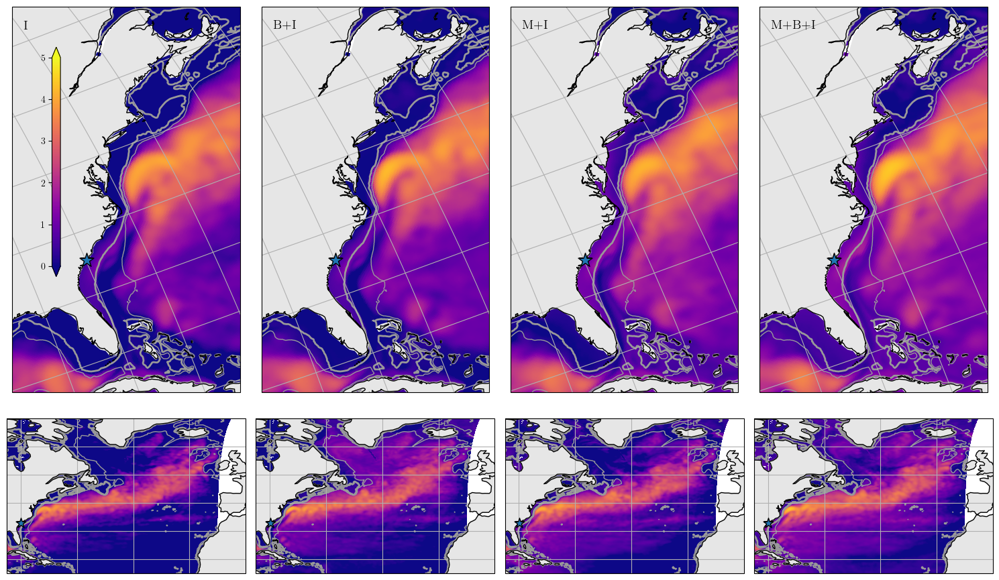

In [45]:
dain=[]
# labels=["M+B+I","M+I/(M+B+I)","B+I/(M+B+I)","I/(M+B+I)"]   # The labels for each line
# nsim=4
labels=["M+B+I","M+I","B+I","I"]   # The labels for each line
labels=labels[::-1]
SSHs=[]
SSHs.append(np.log2(SSH_HR_comp_hp[3].T.std(dim='time')))
SSHs.append(np.log2(SSH_HR_comp_hp[2].T.std(dim='time')))
SSHs.append(np.log2(SSH_HR_comp_hp[1].T.std(dim='time')))
SSHs.append(np.log2(SSH_HR_comp_hp[0].T.std(dim='time')))
depths2=[]
depths2.append(hrdepth)
depths2.append(hrdepth)
depths2.append(hrdepth)
depths2.append(hrdepth)
# plot_ssh_variance_frac(SSHs,depths,da.lon,da.lat, 1.3, labels,'plasma')#mycolors.blue2red_cmap(20))
plot_ssh_variance(SSHs,depths2,da.lon,da.lat, 5, labels,'plasma')#mycolors.blue2red_cmap(20))

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


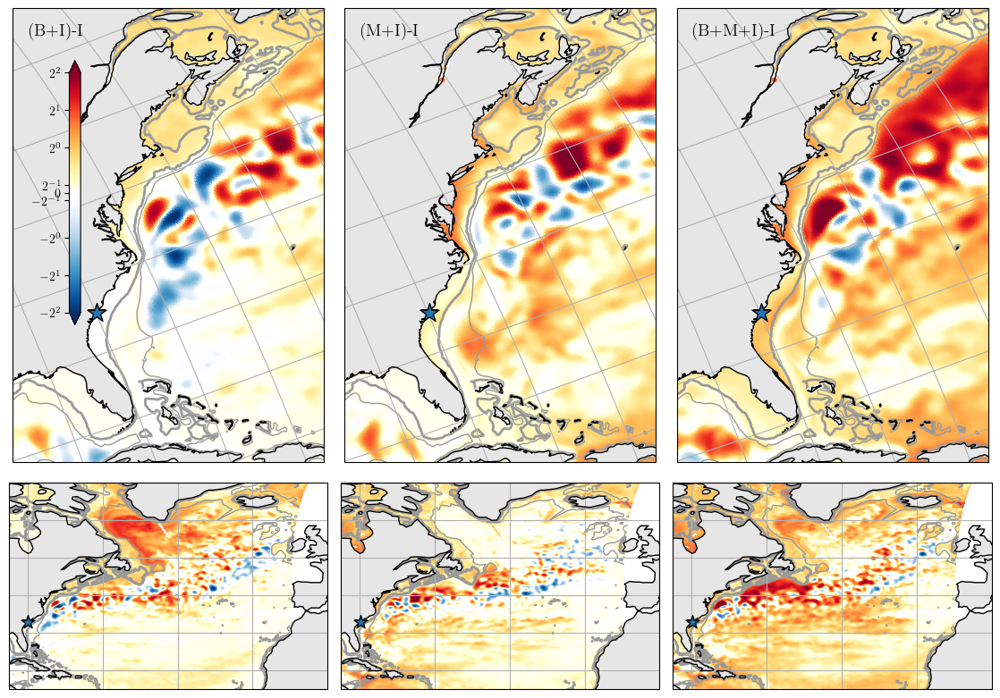

In [46]:
dain=[]
labels=["(B+I)-I","(M+I)-I","(B+M+I)-I"]
# labels=labels[::-1]
SSHs=[]
SSHs.append((SSH_HR_comp_hp[2].T.std(dim='time'))-(SSH_HR_comp_hp[3].T.std(dim='time')))
SSHs.append((SSH_HR_comp_hp[1].T.std(dim='time'))-(SSH_HR_comp_hp[3].T.std(dim='time')))
SSHs.append((SSH_HR_comp_hp[0].T.std(dim='time'))-(SSH_HR_comp_hp[3].T.std(dim='time')))
plot_ssh_timeslice(SSHs,depths2,da.lon,da.lat,-4, labels)

* No increase in variance along coast with addition of buoyancy
* Contribution of momentum North and south of Hatteras. Is that the driver of SAB enhancement relative to LR, and is it coherent?
* Note that M+I still doesn't get the whole variance -- some room for interaction of M+B?

[]

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


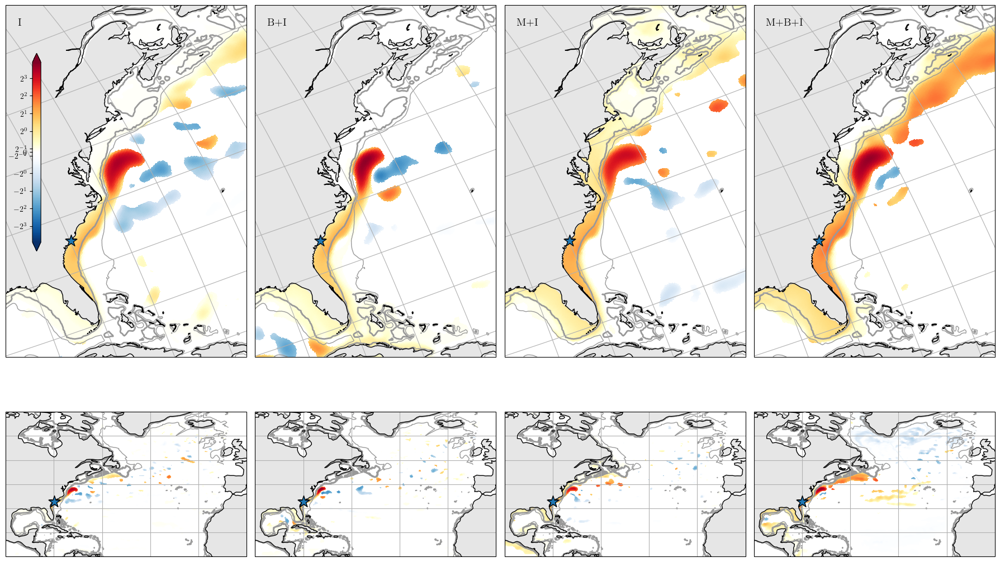

In [51]:
dain=[]
labels=["M+B+I","M+I","B+I","I"]   # The labels for each line
labels=labels[::-1]
dain.append(da_HR_comp_hp[3].T)
dain.append(da_HR_comp_hp[2].T)
dain.append(da_HR_comp_hp[1].T)
dain.append(da_HR_comp_hp[0].T)

SSHs=[]
SSHs.append(SSH_HR_comp_hp[3].T)
SSHs.append(SSH_HR_comp_hp[2].T)
SSHs.append(SSH_HR_comp_hp[1].T)
SSHs.append(SSH_HR_comp_hp[0].T)

dain[0].time.values
plot_ssh_reg3(dain,SSHs,depths2,labels, 0, True)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


<Figure size 1800x1100 with 0 Axes>

<Figure size 1800x1100 with 0 Axes>

<Figure size 1800x1100 with 0 Axes>

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


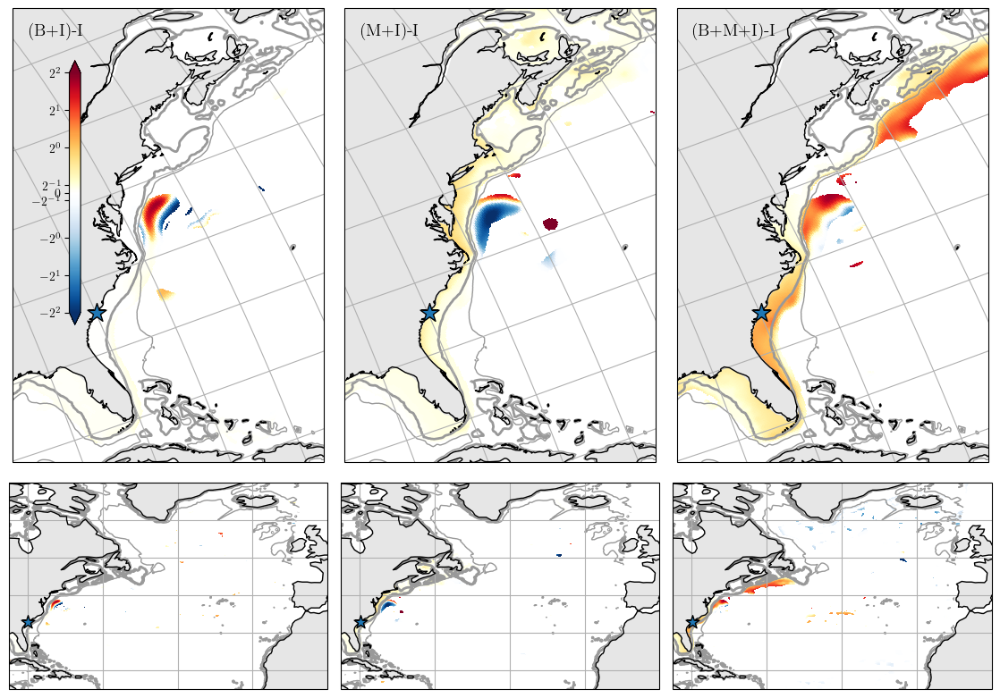

In [47]:
labels=["(B+I)-I","(M+I)-I","(B+M+I)-I"]
dain=[]
SSHs=[]

dain.append(da_HR_comp_hp[2])
dain.append(da_HR_comp_hp[2])
dain.append(da_HR_comp_hp[3])
# dain.append(da_HR_comp_hp[3])
SSHs1=[]
SSHs1.append(SSH_HR_comp_hp[2].T)
SSHs1.append(SSH_HR_comp_hp[2].T)
SSHs1.append(SSH_HR_comp_hp[3].T)
rcs=plot_ssh_reg3(dain,SSHs1,depths2,labels, 0, False, False)
rcs[0]=rcs[0].T+SSH_HR_comp_hp[0].isel(time=0)*0
rcs[1]=rcs[1].T+SSH_HR_comp_hp[0].isel(time=0)*0
SSHs.append(rcs[0]-rcs[1])

dain=[]
dain.append(da_HR_comp_hp[2])
dain.append(da_HR_comp_hp[1])
dain.append(da_HR_comp_hp[3])
# dain.append(da_HR_comp_hp[3])
SSHs1=[]
SSHs1.append(SSH_HR_comp_hp[2].T)
SSHs1.append(SSH_HR_comp_hp[1].T)
SSHs1.append(SSH_HR_comp_hp[3].T)
rcs=plot_ssh_reg3(dain,SSHs1,depths2,labels, 0, False, False)
rcs[0]=rcs[0].T+SSH_HR_comp_hp[0].isel(time=0)*0
rcs[1]=rcs[1].T+SSH_HR_comp_hp[0].isel(time=0)*0
SSHs.append(rcs[0]-rcs[1])

dain=[]
dain.append(da_HR_comp_hp[2])
dain.append(da_HR_comp_hp[0])
dain.append(da_HR_comp_hp[3])
# dain.append(da_HR_comp_hp[3])
SSHs1=[]
SSHs1.append(SSH_HR_comp_hp[2].T)
SSHs1.append(SSH_HR_comp_hp[0].T)
SSHs1.append(SSH_HR_comp_hp[3].T)
rcs=plot_ssh_reg3(dain,SSHs1,depths2,labels, 0, False, False)
rcs[0]=rcs[0].T+SSH_HR_comp_hp[0].isel(time=0)*0
rcs[1]=rcs[1].T+SSH_HR_comp_hp[0].isel(time=0)*0
SSHs.append(rcs[0]-rcs[1])

plot_ssh_timeslice(SSHs,depths2,da.lon,da.lat,-4, labels)

* No dramatic changes in shelf regression coefficient/CHA-associated variability when buoyancy forcing added
* More CHA-assocaited variability along the shelf, slight increase in variability

# LR

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


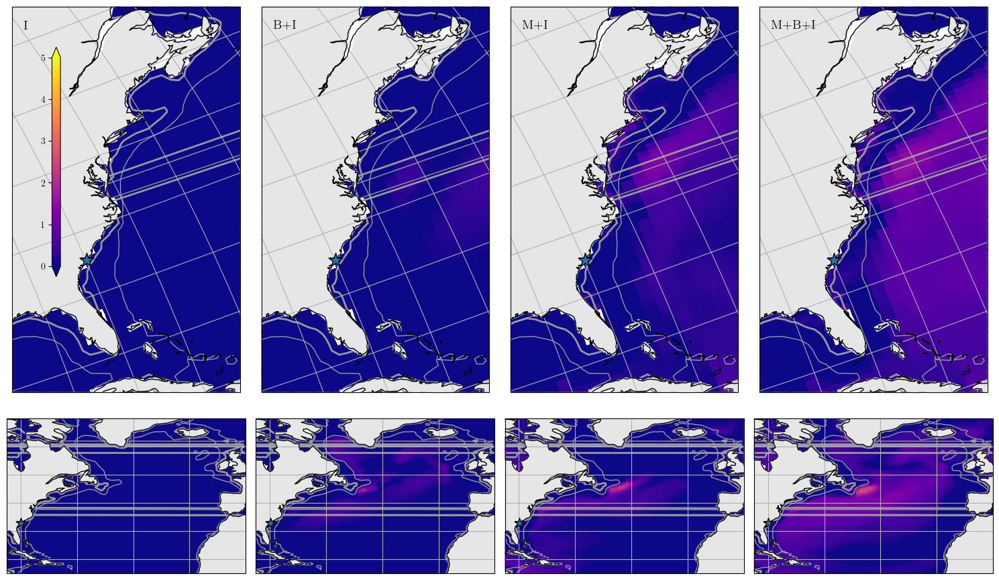

In [53]:
labels=["M+B+I","M+I","B+I","I"]   # The labels for each line
labels=labels[::-1]
SSHs=[]
SSHs.append(np.log2(SSH_LR_comp_hp[3].T.std(dim='time')))
SSHs.append(np.log2(SSH_LR_comp_hp[2].T.std(dim='time')))
SSHs.append(np.log2(SSH_LR_comp_hp[1].T.std(dim='time')))
SSHs.append(np.log2(SSH_LR_comp_hp[0].T.std(dim='time')))
depths2=[]
depths2.append(lrdepth)
depths2.append(lrdepth)
depths2.append(lrdepth)
depths2.append(lrdepth)

# plot_ssh_variance_frac(SSHs,depths,da.lon,da.lat, 1.3, labels,'plasma')#mycolors.blue2red_cmap(20))
plot_ssh_variance(SSHs,depths2,da.lon,da.lat, 5, labels,'plasma')#mycolors.blue2red_cmap(20))

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


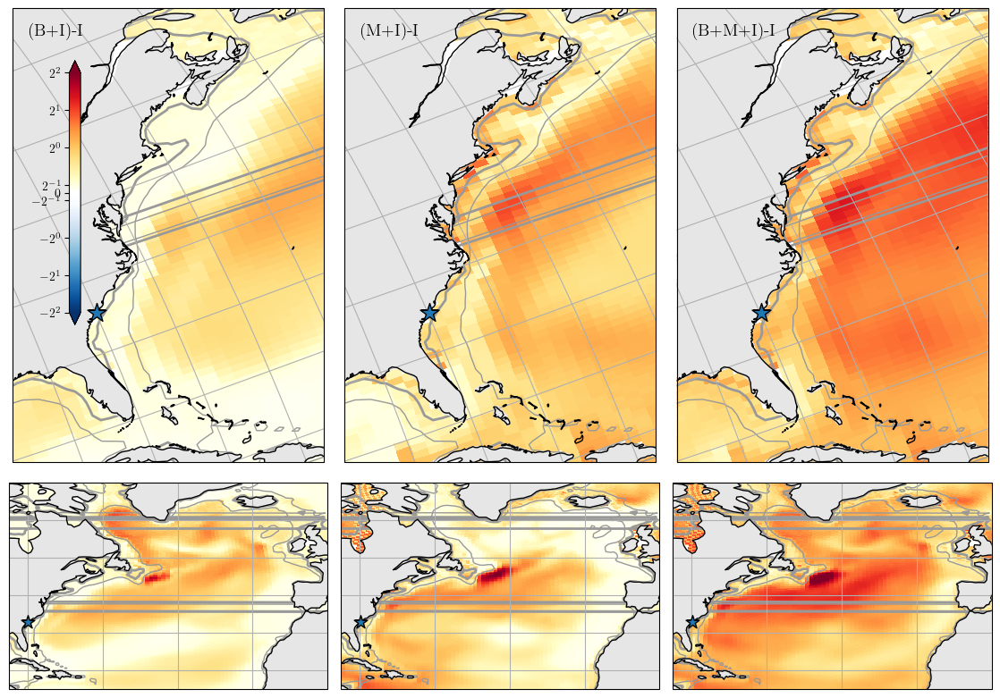

In [56]:
labels=["(B+I)-I","(M+I)-I","(B+M+I)-I"]
# labels=labels[::-1]
SSHs=[]
SSHs.append((SSH_LR_comp_hp[2].T.std(dim='time'))-(SSH_LR_comp_hp[3].T.std(dim='time')))
SSHs.append((SSH_LR_comp_hp[1].T.std(dim='time'))-(SSH_LR_comp_hp[3].T.std(dim='time')))
SSHs.append((SSH_LR_comp_hp[0].T.std(dim='time'))-(SSH_LR_comp_hp[3].T.std(dim='time')))
plot_ssh_timeslice(SSHs,depths2,da.lon,da.lat,-4, labels)

* Too much correlation with interior!

[]

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


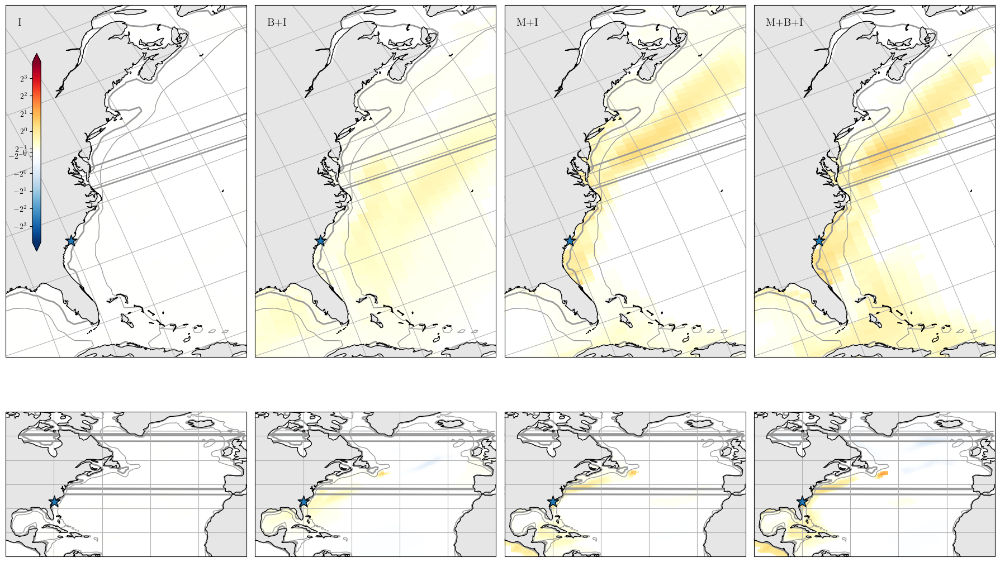

In [57]:
dain=[]
labels=["M+B+I","M+I","B+I","I"]   # The labels for each line
labels=labels[::-1]
dain.append(da_LR_comp_hp[3].T)
dain.append(da_LR_comp_hp[2].T)
dain.append(da_LR_comp_hp[1].T)
dain.append(da_LR_comp_hp[0].T)

SSHs=[]
SSHs.append(SSH_LR_comp_hp[3].T)
SSHs.append(SSH_LR_comp_hp[2].T)
SSHs.append(SSH_LR_comp_hp[1].T)
SSHs.append(SSH_LR_comp_hp[0].T)

plot_ssh_reg3(dain,SSHs,depths2,labels, 0, True)

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


<Figure size 1800x1100 with 0 Axes>

<Figure size 1800x1100 with 0 Axes>

<Figure size 1800x1100 with 0 Axes>

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


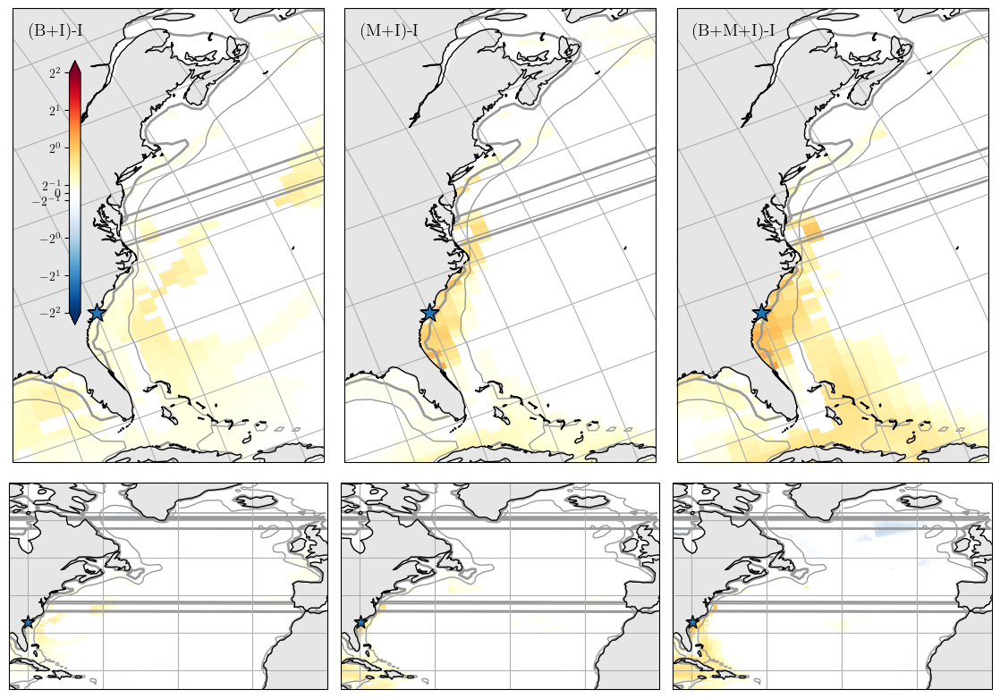

In [59]:
labels=["(B+I)-I","(M+I)-I","(B+M+I)-I"]
dain=[]
SSHs=[]

dain.append(da_LR_comp_hp[2])
dain.append(da_LR_comp_hp[2])
dain.append(da_LR_comp_hp[3])
# dain.append(da_HR_comp_hp[3])
SSHs1=[]
SSHs1.append(SSH_LR_comp_hp[2].T)
SSHs1.append(SSH_LR_comp_hp[2].T)
SSHs1.append(SSH_LR_comp_hp[3].T)
rcs=plot_ssh_reg3(dain,SSHs1,depths2,labels, 0, False, False)
rcs[0]=rcs[0].T+SSH_LR_comp_hp[0].isel(time=0)*0
rcs[1]=rcs[1].T+SSH_LR_comp_hp[0].isel(time=0)*0
SSHs.append(rcs[0]-rcs[1])

dain=[]
dain.append(da_LR_comp_hp[2])
dain.append(da_LR_comp_hp[1])
dain.append(da_LR_comp_hp[3])
# dain.append(da_HR_comp_hp[3])
SSHs1=[]
SSHs1.append(SSH_LR_comp_hp[2].T)
SSHs1.append(SSH_LR_comp_hp[1].T)
SSHs1.append(SSH_LR_comp_hp[3].T)
rcs=plot_ssh_reg3(dain,SSHs1,depths2,labels, 0, False, False)
rcs[0]=rcs[0].T+SSH_LR_comp_hp[0].isel(time=0)*0
rcs[1]=rcs[1].T+SSH_LR_comp_hp[0].isel(time=0)*0
SSHs.append(rcs[0]-rcs[1])

dain=[]
dain.append(da_LR_comp_hp[2])
dain.append(da_LR_comp_hp[0])
dain.append(da_LR_comp_hp[3])
# dain.append(da_HR_comp_hp[3])
SSHs1=[]
SSHs1.append(SSH_LR_comp_hp[2].T)
SSHs1.append(SSH_LR_comp_hp[0].T)
SSHs1.append(SSH_LR_comp_hp[3].T)
rcs=plot_ssh_reg3(dain,SSHs1,depths2,labels, 0, False, False)
rcs[0]=rcs[0].T+SSH_LR_comp_hp[0].isel(time=0)*0
rcs[1]=rcs[1].T+SSH_LR_comp_hp[0].isel(time=0)*0
SSHs.append(rcs[0]-rcs[1])

plot_ssh_timeslice(SSHs,depths2,da.lon,da.lat,-4, labels)

* Too much of a STG pathway?

# Decadal

/glade/derecho/scratch/clittle/tmp/ipykernel_47552/515606108.py:33: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects
/glade/derecho/scratch/clittle/tmp/ipykernel_47552/515606108.py:53: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax.legend([],     # The line objects


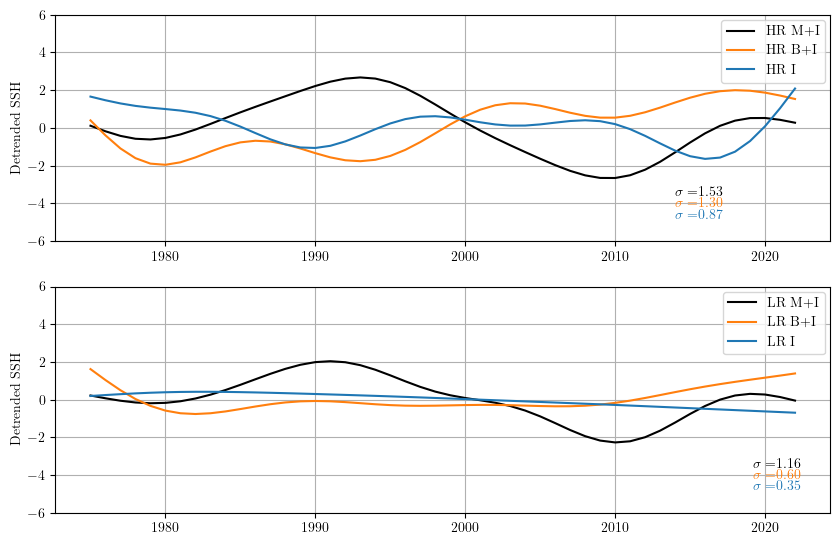

In [54]:
fig = plt.figure(figsize=(10,10))#, tight_layout=True)
ax = plt.subplot2grid((3,3), (0,0), colspan=3, rowspan=1)    
# sims=[1,2,3,4]
sims=[1,2,3]
for nsims in np.arange(len(sims)):
    nsim=sims[nsims]
    line = ax.plot(da_HR_comp_lp[nsim].time,da_HR_comp_lp[nsim],cols[nsims], label = 'data')
            
    tt1=(da_HR_comp_lp[nsim]).std()
    # tt2=(da_HR_comp[nsim]).sel(time=slice(2001,2022)).std()
    
    ax.text(.8,.2-.05*nsims, '$\sigma=$'+str('{0:.2f}'.format(tt1)),#+', ',
                transform=ax.transAxes, fontsize=10, weight='bold',color=cols[nsims])
    # ax.text(.9,.2-.05*nsims, '$\sigma=$'+str('{0:.2f}'.format(tt2)),#+', ',
    #             transform=ax.transAxes, fontsize=14, weight='bold',color=cols[nsims]) 
    
    # tt=np.corrcoef(da_HR_comp_hp[1],da_HR_comp_hp[2])
    # ax.text(.5,.93, '$r_{M,B}=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
    #             transform=ax.transAxes, fontsize=10, weight='bold',color='C1')
    # tt=np.corrcoef(da_HR_comp_hp[1],da_HR_comp_hp[4])
    # ax.text(.5,.87, '$r_{M,R}=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
    #             transform=ax.transAxes, fontsize=10, weight='bold',color='C1')            
    # tt=np.corrcoef(da_HR_comp_hp[2],da_HR_comp_hp[4])
    # ax.text(.5,.81, '$r_{B,R}=$'+str('{0:.2f}'.format(tt[0,1])),#+', ',
    #             transform=ax.transAxes, fontsize=10, weight='bold',color='C1')   

    plt.grid()
# line = ax.plot(da_SH_lp[0].time,da_SH_lp[0],cols[4], label = 'data')
# line = ax.plot(da_HR_comp_lp[0].time,da_HR_comp_lp[0],cols[4], label = 'data')
# line = ax.plot(da_SH_lp[0].time,da_SH_lp[1],cols[4], label = 'data',ls='--')
plt.ylim(-6,6)
plt.ylabel('Detrended SSH')
ax.legend([],     # The line objects
       labels=["HR M+I","HR B+I","HR I"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=10,# Title for the legend
         )

ax = plt.subplot2grid((3,3), (1,0), colspan=3, rowspan=1)    
for nsims in np.arange(len(sims)):
    nsim=sims[nsims]
    line = ax.plot(da_HR_comp_lp[nsim].time,da_LR_comp_lp[nsim],cols[nsims], label = 'data')

    tt=(da_LR_comp_lp[nsim]).std()
    ax.text(.9,.2-.05*nsims, '$\sigma=$'+str('{0:.2f}'.format(tt)),#+', ',
                transform=ax.transAxes, fontsize=10, weight='bold',color=cols[nsims])

plt.grid()
plt.ylim(-6,6)
plt.ylabel('Detrended SSH')
ax.legend([],     # The line objects
       labels=["LR M+I","LR B+I","LR I"],   # The labels for each line
       loc="upper right",   # Position of legend
       borderaxespad=0.4,    # Small spacing around legend box
       title="",
       fontsize=10,# Title for the legend
         )
          

/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)
/glade/work/clittle/conda-envs/myorigpythonenv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


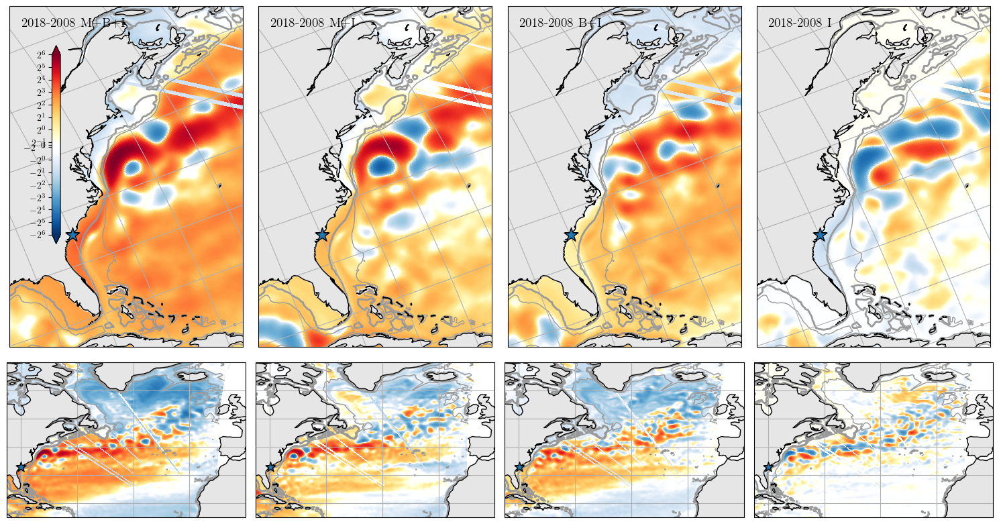

In [55]:
labels=["","M+I","B+I","I"]
labels=[str(t2) + "-" + str(t1) + " M+B+I",str(t2) + "-" + str(t1) + " M+I",str(t2) + "-" + str(t1) + " B+I",str(t2) + "-" + str(t1) + " I"]   # The labels for each line

SSHs=[]
# t1=2006
# t2=t1+10
# t3=t2+10

SSHs.append(SSH_HR_comp_lp[0].sel(time=t2)-SSH_HR_comp_lp[0].sel(time=t1))
SSHs.append(SSH_HR_comp_lp[1].sel(time=t2)-SSH_HR_comp_lp[1].sel(time=t1))
SSHs.append(SSH_HR_comp_lp[2].sel(time=t2)-SSH_HR_comp_lp[2].sel(time=t1))
SSHs.append(SSH_HR_comp_lp[3].sel(time=t2)-SSH_HR_comp_lp[3].sel(time=t1))

plot_ssh_timeslice(SSHs,depths,da.lon,da.lat,-64, labels)